In [909]:
# finding the optimal bin size using the formula Hb = Ht - mean(Hnj)
def bin_for_burst_relate_info(train_mat):
    
    sizes_options = np.arange(5,10,1)
    list_Hb = []
    num_trials, len_trial = np.shape(train_mat)
    
    for s in sizes_options:
        probs_list = np.zeros(s+1)
        # convert the mat to binned mat using different size bin each time
        # fill in a list of all the probabilities for each number of spikes in bin (between 0 to size bin)
        binned_mat = []
        for trial in range(num_trials):
            binned_trial = []
            for cell in range(len_trial):
                if cell >= len_trial - 5:
                    num_spikes_in_bin = np.sum(train_mat[trial][cell : -1])
                else:
                    num_spikes_in_bin = np.sum(train_mat[trial][cell : cell + s])
                binned_trial.append(num_spikes_in_bin)
                
                # count the probabilities
                probs_list[num_spikes_in_bin] += 1
            binned_mat.append(binned_trial)
        
        
        total_num_cells = len(binned_mat[0])*num_trials
#         print('total_num_cells = ',total_num_cells)
        probs_list = np.array(probs_list) / total_num_cells
        
        # calculate Ht
        Ht = 0
#         print('probs = ', probs_list)
        for p in probs_list:
            if p != 0:
                Ht += p * np.log2(p)
        Ht = -Ht
#         print('Ht = ',Ht)
            
        # calculate mean Hnj
        noise_list_entropies = []
        k = 1
        for b in range(len(binned_mat[0])):
            temp_probs_noise_list = np.zeros(s+1)
            if k > 1:
                temp_probs_noise_list[0] = num_trials*(k-1)
            
            for t in range(num_trials):
                num_spikes = binned_mat[t][b]
                temp_probs_noise_list[num_spikes] += 1

            if temp_probs_noise_list[0] == (num_trials*k):
                k += 1
            else:
                temp_probs_noise_list = np.array(temp_probs_noise_list) / (num_trials*k)
                temp_Hn = 0
                
                for p in temp_probs_noise_list:
                    if p != 0:
                        temp_Hn += p * np.log2(p)
                temp_Hn = -temp_Hn
                noise_list_entropies.append(temp_Hn)

                k = 1
        print('len of noise_list_entropies = ',len(noise_list_entropies))
        print('noise_list_entropies = ',noise_list_entropies)
        temp_mean_Hnj = np.mean(noise_list_entropies)
#         print('Hnj = ',temp_mean_Hnj)
        # to allow compatison Ht and the averaging we dividing the Ht by Hnj
        temp_correct_Ht = Ht / temp_mean_Hnj
        # calculate Hb
        temp_Hb = temp_correct_Ht - temp_mean_Hnj 
        list_Hb.append(temp_Hb)
        
    # find minimal Hb (min entropy => max information)
    minimal_Hb = np.min(list_Hb)
    minimal_Hb_index = np.where(list_Hb == minimal_Hb)
    
    # find the index to get the best size
    best_bin_size = sizes_options[minimal_Hb_index]
    
    return best_bin_size, minimal_Hb

In [1062]:
import pandas as pd
import scipy as sci
import matplotlib.pyplot as plt
import numpy as np
import math 
import scipy as sci

### 1 - paper assignment: Information theory uses

In [1246]:
data_mat = np.load('information theory/spk_mat.npy')
np.shape(data_mat)

(8, 72000)

In [1247]:
'''
This function finding the optimal bin size using the formula Hb = Ht - mean(Hnj)
It checking the sizes between 5 - 100, and return the bin that received the highest information
Input: Matrix of neurons recording, while each row represent different neuron 
Output: Bin Size
'''
def bin_for_burst_relate_info_new(train_mat):
    
    sizes_options = np.arange(5,100,1)
    list_Hb = []
    num_trials, len_trial = np.shape(train_mat)
    
    for s in sizes_options:
        probs_list = np.zeros(s+1)
        # convert the mat to binned mat using different size bin each time
        # fill in a list of all the probabilities for each number of spikes in bin (between 0 to size bin)
        binned_mat = []
        for trial in range(num_trials):
            binned_trial = []
            for cell in range(len_trial):
                if cell >= len_trial - s:
#                     print(train_mat[trial][cell : cell + s])
                    num_spikes_in_bin = np.sum(train_mat[trial][cell : -1])
                else:
#                     print('in =', len(train_mat[trial][cell : cell + s]))
                    num_spikes_in_bin = np.sum(train_mat[trial][cell : (cell + s)])
                binned_trial.append(num_spikes_in_bin)
                
                # count the probabilities
#                 print(s,num_spikes_in_bin)
                probs_list[num_spikes_in_bin] += 1
            binned_mat.append(binned_trial)
        
        
        total_num_cells = len(binned_mat[0])*num_trials
        probs_list = np.array(probs_list) / total_num_cells
        
        # calculate Ht
        Ht = 0
#         print('Ht =',np.sum(probs_list))
        for p in probs_list:
            if p != 0:
                Ht += p * np.log2(p)
        Ht = -Ht
            
        # calculate mean Hnj
        noise_list_entropies = []
        first_non_zeros_probs = np.zeros(s+1)
        saw_first_non_zero = False
        k = 1
        for b in range(len(binned_mat[0])):
            temp_probs_noise_list = np.zeros(s+1)
            for t in range(num_trials):
                num_spikes = binned_mat[t][b]
                temp_probs_noise_list[num_spikes] += 1

            if temp_probs_noise_list[0] == (num_trials):
                k += 1
                first_non_zeros_probs[0] += num_trials
            else:
                if not saw_first_non_zero:
                    saw_first_non_zero = True
                    for i,p in enumerate(temp_probs_noise_list):
                        first_non_zeros_probs[i] += p
                else:
                    temp_probs_noise_list = np.array(temp_probs_noise_list) / (num_trials)
                    temp_Hn = 0
#                     print('temp Hn =', np.sum(temp_probs_noise_list))
                    for p in temp_probs_noise_list:
                        if p != 0:
                            temp_Hn += p * np.log2(p)
                    temp_Hn = -temp_Hn
                    noise_list_entropies.append(temp_Hn)

        #calculate the Hn for the first non zero 
        first_non_zeros_probs = np.array(first_non_zeros_probs) / (num_trials*k)
        temp_Hn = 0
#         print('first non zero = ',np.sum(first_non_zeros_probs))
        for p in first_non_zeros_probs:
            if p != 0:
                temp_Hn += p * np.log2(p)
        temp_Hn = -temp_Hn
        noise_list_entropies.append(temp_Hn)        
        

        temp_mean_Hnj = np.mean(noise_list_entropies)

        # to allow compatison Ht and the averaging we dividing the Ht by Hnj
        temp_correct_Ht = Ht / temp_mean_Hnj
        
        # calculate Hb
        temp_Hb = temp_correct_Ht - temp_mean_Hnj 
#         list_Hb.append(temp_Hb)
        list_Hb.append(temp_Hb / s) # normalize to bin size
        
#     # find minimal Hb (min entropy => max information)
#     minimal_Hb = np.min(list_Hb )
#     minimal_Hb_index = np.where(list_Hb == minimal_Hb)
    
#     # find the index to get the best size
#     best_bin_size_min = sizes_options[minimal_Hb_index]
    
    # find the maximal information
    maximal_Hb = np.max(list_Hb )
    maximal_Hb_index = np.where(list_Hb == maximal_Hb)
    
    # find the index to get the best size
    best_bin_size = sizes_options[maximal_Hb_index]
    
    return best_bin_size, maximal_Hb

In [1251]:
opt_bin, hb_max = bin_for_burst_relate_info_new(data_mat)
opt_bin, hb_max

(array([5]), 0.022455406009032286)

In [1252]:
opt_bin, hb_max = bin_for_burst_relate_info_new(data_mat[:,0:10000])
opt_bin, hb_max

(array([5]), 0.02600557882609773)

In [1253]:
opt_bin, hb_max = bin_for_burst_relate_info_new(data_mat[:,0:1000])
opt_bin, hb_max

(array([5]), 0.03943425061227788)

In [1249]:

'''
This function generate simulated data using 3 Poisson neurons
Input:  1. Duration time in seconds (like 10)
        2. rate1 - baseline rate (number between 0 to 1 like 0.03)
        3. rate2 - activity rate (number between 0 to 1 like 0.5)
        4. switch time - between the two rates in sec (like 2)
Output: Matrix of 3 neurons, each row represent a neuron, column represented each sample (sample 1000Hz)
'''
def generate_data(duration, rate1, rate2, switch_time):
    samp = 1000
    rate1 = rate1
    rate2 = rate2
    duration = duration
    switch_time = switch_time
    
    
    neurons = []
    num_neurons = 3

    for n in range(num_neurons):
        temp_n = []
        i=0
        iter_num = 1
        while i < duration*samp:
            if i == switch_time*iter_num*samp:
                iter_num += 1
                t = 0
                while t < switch_time*samp and i < duration*samp:
                    temp_spk = 1 if np.random.random()<rate2 else 0
                    temp_n.append(temp_spk)
                    t += 1
                    i += 1
            else:
                temp_spk = 1 if np.random.random()<rate1 else 0
                temp_n.append(temp_spk)
                i += 1
        neurons.append((temp_n))
    
    return np.array(neurons)

In [1250]:
my_generated_data = generate_data(10,0.1,0.7,3)
print(np.shape(my_generated_data))
opt_bin_on_my_data, hb_my_data = bin_for_burst_relate_info_new(my_generated_data)
opt_bin_on_my_data, hb_my_data


(3, 10000)


(array([5]), 0.266244056762455)

In [1234]:
my_generated_data[:,3900:4100]

array([[1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 1,
        1, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
        0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1,
        1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
        1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0,
        1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1,
        1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1,
        1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
        0, 0],
       [0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1,
        1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0,
        1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0,
        0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1,
        1, 1, 1, 1, 1, 

In [1165]:
opt_bin_on_my_data, hb_my_data = bin_for_burst_relate_info_new(my_generated_data[:,0:1000])
opt_bin_on_my_data, hb_my_data


(array([5]), 2.2714388934859913)

In [1166]:
opt_bin_on_my_data, hb_my_data = bin_for_burst_relate_info_new(my_generated_data[:,0:500])
opt_bin_on_my_data, hb_my_data

(array([5]), 1.4723616269961188)

In [1196]:
def divide_to_indi_neurons(data_mat):
    entropies = []
    for n in data_mat:
        entropy = find_entropy_indi(n)
        entropies.append(entropy)
    return entropies

In [1254]:
def find_entropy_indi(neuron):
        probs_list = np.zeros(5+1)
        binned_trial = []
        for cell in range(len(neuron)):
            if cell >= len(neuron) - 5:
                num_spikes_in_bin = np.sum(neuron[cell : -1])
            else:
                num_spikes_in_bin = np.sum(neuron[cell : (cell + 5)])
            binned_trial.append(num_spikes_in_bin)
                
            # count the probabilities
            probs_list[num_spikes_in_bin] += 1
        
        
        total_num_cells = len(binned_trial)
        probs_list = np.array(probs_list) / total_num_cells
        # calculate Ht
        Ht = 0
        print(np.sum(probs_list))
        for p in probs_list:
            if p != 0:
                Ht += p * np.log2(p)
        Ht = -Ht
        return Ht

In [1255]:
entros = divide_to_indi_neurons(data_mat[:,0:9000])
entros

1.0
1.0
1.0
1.0
1.0000000000000002
0.9999999999999999
1.0
1.0


[2.2061823715088384,
 2.1376636016293715,
 2.0840502182846254,
 1.9952691481173965,
 1.9735811961228686,
 1.9381956492833716,
 2.0312429746361906,
 2.0243146011661413]

In [1201]:
def find_probabilities_indi(neuron):
        probs_list = np.zeros(5+1)
        binned_trial = []
        for cell in range(len(neuron)):
            if cell >= len(neuron) - 5:
                num_spikes_in_bin = np.sum(neuron[cell : -1])
            else:
                num_spikes_in_bin = np.sum(neuron[cell : (cell + 5)])
            binned_trial.append(num_spikes_in_bin)
                
            # count the probabilities
            probs_list[num_spikes_in_bin] += 1
        
        
        total_num_cells = len(binned_trial)
        probs_list = np.array(probs_list) / total_num_cells
        
        return probs_list

In [1222]:
p1 = find_probabilities_indi(data_mat[0,0:9000])
p2 = find_probabilities_indi(data_mat[1,0:9000])
p3 = find_probabilities_indi(data_mat[2,0:9000])
p4 = find_probabilities_indi(data_mat[3,0:9000])
p5 = find_probabilities_indi(data_mat[4,0:9000])
p6 = find_probabilities_indi(data_mat[5,0:9000])
p7 = find_probabilities_indi(data_mat[6,0:9000])
p8 = find_probabilities_indi(data_mat[7,0:9000])
probs_without_3 = [p1,p2,p4,p5,p6,p7,p8]
probs_without_7 = [p1,p2,p3,p4,p5,p6,p8]
probs_without_8 = [p1,p2,p3,p4,p5,p6,p7]

In [1223]:
r = []
for p in probs_without_3:
    m = 0
    for i in p:
        for j in p3:
            m += (i*j)*np.log2(i*j)
    r.append(-m)
r

[4.290232589793464,
 4.2217138199139965,
 4.079319366402022,
 4.057631414407496,
 4.022245867567998,
 4.115293192920815,
 4.108364819450768]

In [1224]:
entros_without_3 = [entros[0],entros[1],entros[3],entros[4],entros[5],entros[6],entros[7]]
entros_without_3_arr = np.array(entros_without_3)
r_arr = np.array(r)
r_arr - entros_without_3_arr

array([2.08405022, 2.08405022, 2.08405022, 2.08405022, 2.08405022,
       2.08405022, 2.08405022])

In [1225]:
r = []
for p in probs_without_7:
    m = 0
    for i in p:
        for j in p7:
            m += (i*j)*np.log2(i*j)
    r.append(-m)
r

[4.23742534614503,
 4.168906576265564,
 4.115293192920815,
 4.026512122753588,
 4.004824170759059,
 3.969438623919562,
 4.0555575758023314]

In [1226]:
entros_without_7 = [entros[0],entros[1],entros[3],entros[4],entros[5],entros[2],entros[7]]
entros_without_7_arr = np.array(entros_without_7)
r_arr = np.array(r)
r_arr - entros_without_7_arr

array([2.03124297, 2.03124297, 2.12002404, 2.05293093, 2.06662852,
       1.88538841, 2.03124297])

In [1227]:
r = []
for p in probs_without_8:
    m = 0
    for i in p:
        for j in p8:
            m += (i*j)*np.log2(i*j)
    r.append(-m)
r

[4.230496972674978,
 4.161978202795512,
 4.108364819450768,
 4.019583749283537,
 3.99789579728901,
 3.9625102504495135,
 4.05555757580233]

In [1228]:
entros_without_8 = [entros[0],entros[1],entros[3],entros[4],entros[5],entros[6],entros[2]]
entros_without_8_arr = np.array(entros_without_8)
r_arr = np.array(r)
r_arr - entros_without_8_arr

array([2.0243146 , 2.0243146 , 2.11309567, 2.04600255, 2.05970015,
       1.93126728, 1.97150736])

In [916]:
def divide_sec(spk_train, num_sec):
    divides = []
    num_elements = int((len(spk_train)/1000)/9)
    for i in range(num_elements):
        temp_train = spk_train[i*num_sec*1000 : i*num_sec*1000+num_sec*1000]
        divides.append(temp_train) 
    return divides

In [917]:
def find_entropied_after_reshape_data(data, num_sec):
    num_trials, len_trial = np.shape(data)
    eff_entropies = np.zeros(num_trials)
    for i in range(num_trials):
        divided_neuron = divide_sec(data[i],num_sec)
        bin_s, entropy_neuron = bin_for_burst_relate_info(divided_neuron)
        eff_entropies[i] = entropy_neuron
    return eff_entropies

In [918]:
effective_entropies = find_entropied_after_reshape_data(data_mat,9)
effective_entropies

len of noise_list_entropies =  8999
noise_list_entropies =  [1.75, 1.5, 1.5487949406953985, 1.9056390622295665, 1.0, 1.561278124459133, 1.5, 1.4056390622295665, 1.9056390622295665, 1.5, 1.9056390622295665, 1.5487949406953985, 2.25, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.561278124459133, 2.0, 1.811278124459133, 1.9056390622295665, 1.75, 1.561278124459133, 1.4056390622295665, 1.75, 2.1556390622295662, 1.75, 1.811278124459133, 2.25, 2.1556390622295662, 2.0, 2.25, 2.1556390622295662, 2.1556390622295662, 2.25, 1.9056390622295665, 2.0, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 2.25, 2.1556390622295662, 1.9056390622295665, 2.25, 1.9056390622295665, 1.5, 1.811278124459133, 1.75, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 1.561278124459133, 0.8112781244591328, 1.5, 1.75, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.5, 1.40563906222956

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 1.5487949406953985, 1.561278124459133, 1.0, 1.75, 1.2987949406953985, 1.75, 2.0, 1.9056390622295665, 1.811278124459133, 2.0, 2.25, 2.25, 2.1556390622295662, 1.5487949406953985, 1.75, 1.9056390622295665, 2.25, 1.4056390622295665, 1.75, 1.811278124459133, 1.2987949406953985, 1.811278124459133, 1.561278124459133, 2.4056390622295662, 2.1556390622295662, 2.5, 2.0, 2.5, 2.4056390622295662, 2.5, 2.5, 2.1556390622295662, 2.1556390622295662, 2.25, 1.9056390622295665, 2.25, 2.1556390622295662, 1.811278124459133, 2.25, 1.811278124459133, 2.25, 2.5, 1.75, 2.4056390622295662, 1.811278124459133, 2.25, 1.811278124459133, 1.811278124459133, 2.1556390622295662, 2.25, 2.1556390622295662, 2.25, 1.561278124459133, 2.0, 1.4056390622295665, 1.5, 1.5, 1.75, 1.811278124459133, 2.1556390622295662, 1.9056390622295665, 1.561278124459133, 1.75, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.905639062

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.561278124459133, 1.061278124459133, 1.75, 1.75, 1.5487949406953985, 2.0, 1.811278124459133, 2.1556390622295662, 1.75, 2.5, 2.5, 1.75, 1.061278124459133, 1.75, 2.25, 1.9056390622295665, 2.0, 2.25, 1.2987949406953985, 1.5487949406953985, 1.811278124459133, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 2.5, 2.4056390622295662, 2.1556390622295662, 2.5, 2.1556390622295662, 2.5, 1.75, 2.25, 2.25, 2.25, 2.1556390622295662, 2.5, 2.25, 2.5, 2.5, 1.9056390622295665, 1.9056390622295665, 2.25, 2.1556390622295662, 1.811278124459133, 1.811278124459133, 2.25, 2.5, 1.9056390622295665, 2.5, 1.9056390622295665, 1.75, 1.9056390622295665, 1.811278124459133, 1.5, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 2.0, 1.9056390622295665, 1.75, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 2.25, 2.25, 2.1556390622

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.5487949406953985, 1.811278124459133, 1.811278124459133, 1.2987949406953985, 1.5487949406953985, 1.5487949406953985, 1.75, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.25, 2.4056390622295662, 1.75, 1.811278124459133, 1.75, 2.0, 1.9056390622295665, 2.25, 2.25, 1.5, 1.75, 1.4056390622295665, 2.1556390622295662, 2.5, 2.5, 2.1556390622295662, 2.75, 2.5, 2.1556390622295662, 2.4056390622295662, 2.1556390622295662, 2.5, 2.1556390622295662, 2.5, 2.5, 2.5, 1.75, 2.75, 2.75, 2.1556390622295662, 2.5, 1.9056390622295665, 2.4056390622295662, 2.5, 2.5, 2.5, 2.1556390622295662, 2.5, 2.25, 2.25, 2.1556390622295662, 2.0, 1.811278124459133, 1.4056390622295665, 2.25, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 2.25, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 2.5, 2.25, 2.0, 2.1556390622295662

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5487949406953985, 1.2987949406953985, 1.811278124459133, 1.75, 1.75, 1.75, 1.5, 2.25, 1.9056390622295665, 1.75, 1.75, 2.4056390622295662, 2.1556390622295662, 1.5487949406953985, 1.9056390622295665, 1.5487949406953985, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.4056390622295665, 1.9056390622295665, 2.4056390622295662, 2.25, 2.1556390622295662, 2.5, 2.5, 2.1556390622295662, 2.4056390622295662, 2.5, 2.1556390622295662, 2.5, 2.25, 2.1556390622295662, 2.5, 2.25, 2.4056390622295662, 2.5, 2.5, 2.5, 1.9056390622295665, 2.5, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 2.4056390622295662, 2.75, 2.4056390622295662, 2.25, 1.5, 1.9056390622295665, 1.561278124459133, 2.1556390622295662, 2.25, 2.1556390622295662, 2.25, 1.561278124459133, 2.1556390622295662, 2.25, 2.25, 2.25, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 

len of noise_list_entropies =  8999
noise_list_entropies =  [1.4056390622295665, 1.561278124459133, 1.5, 1.811278124459133, 1.061278124459133, 1.5, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.25, 2.25, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.811278124459133, 2.1556390622295662, 2.25, 1.2987949406953985, 1.561278124459133, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 1.9056390622295665, 1.5487949406953985, 1.4056390622295665, 2.0, 1.9056390622295665, 2.1556390622295662, 1.75, 2.1556390622295662, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.0, 1.75, 1.9056390622295665, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 1.75, 1.75, 1.75, 1.9056390622295665, 1.75, 1.4056390622295665, 1.9056390622295665, 1.5, 1.4056390622295665, 1.75, 1.9056390622295665, 1.75, 1.75, 1.75, 0.954434002924965, 1.561278124459133, 1.9056390622295665, 2.1556390

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5, 1.9056390622295665, 1.811278124459133, 1.0, 1.75, 1.9056390622295665, 2.0, 1.9056390622295665, 2.5, 2.1556390622295662, 1.75, 2.1556390622295662, 2.1556390622295662, 2.25, 1.75, 1.9056390622295665, 1.5487949406953985, 2.0, 1.75, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.75, 2.0, 2.0, 2.1556390622295662, 2.0, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.75, 1.75, 1.75, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 0.954434002924965, 2.25, 1.561278124459133, 1.4056390622295665, 2.1556390622295662, 1.9056390622295665, 1.5, 1.561278124459133, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.5, 1.4056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.75, 1.5, 1.5, 1.5, 2.1556390622295662, 1.811278124459133, 2.25, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.5, 1.75, 1.5487949406953985, 1.811278124459133, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.9056390622295665, 1.5487949406953985, 2.1556390622295662, 1.75, 1.9056390622295665, 1.2987949406953985, 2.25, 2.4056390622295662, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.0, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 2.25, 2.25, 2.25, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.0, 1.4056390622295665, 1.9056390622295665, 1.9056390622295665, 2.0, 1.75, 2.0, 1.811278124459133, 1.90

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5, 1.2987949406953985, 1.811278124459133, 1.9056390622295665, 2.25, 2.1556390622295662, 2.5, 2.1556390622295662, 1.75, 2.25, 2.1556390622295662, 2.5, 2.25, 1.75, 1.811278124459133, 2.0, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.5, 1.811278124459133, 2.0, 2.4056390622295662, 2.25, 2.0, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.0, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 2.5, 2.5, 2.25, 2.5, 1.561278124459133, 1.75, 1.75, 2.25, 1.9056390622295665, 2.1556390622295662, 1.75, 2.25, 2.1556390622295662, 2.0, 1.75, 1.9056390622295665, 1.9056390622295665, 2.25, 2.25, 1.9056390622295665, 2.0, 1.4056390622295665, 1.4056390622295665, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.5, 1.4056390622295665, 1.75, 1.811278124459133, 1.5

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5, 1.2987949406953985, 1.4056390622295665, 1.75, 2.5, 2.25, 1.9056390622295665, 2.0, 2.1556390622295662, 1.811278124459133, 2.4056390622295662, 2.1556390622295662, 2.1556390622295662, 1.061278124459133, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.4056390622295662, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.25, 2.5, 2.0, 2.0, 1.5487949406953985, 2.4056390622295662, 2.1556390622295662, 2.0, 2.5, 1.811278124459133, 2.5, 2.25, 2.1556390622295662, 2.5, 1.9056390622295665, 2.25, 2.0, 2.1556390622295662, 2.1556390622295662, 1.75, 2.1556390622295662, 2.25, 2.1556390622295662, 2.25, 1.9056390622295665, 1.9056390622295665, 1.561278124459133, 2.25, 2.5, 2.4056390622295662, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.75, 1.75, 2.1556390622295662, 1.75, 1.4056390622

len of noise_list_entropies =  8999
noise_list_entropies =  [1.5487949406953985, 1.2987949406953985, 1.75, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.811278124459133, 0.8112781244591328, 1.061278124459133, 1.9056390622295665, 2.1556390622295662, 1.75, 1.5487949406953985, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 1.2987949406953985, 1.0, 0.954434002924965, 1.561278124459133, 1.9056390622295665, 1.75, 1.4056390622295665, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.75, 1.9056390622295665, 1.4056390622295665, 1.061278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.75, 1.75, 1.561278124459133, 1.4056390622295665, 0.954434002924965, 1.4056390622295665, 1.2987949406953

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.75, 1.811278124459133, 1.2987949406953985, 1.9056390622295665, 1.75, 1.061278124459133, 1.2987949406953985, 1.5, 1.9056390622295665, 1.5, 2.0, 2.0, 2.1556390622295662, 2.4056390622295662, 2.5, 2.5, 2.1556390622295662, 1.2987949406953985, 1.561278124459133, 1.561278124459133, 1.561278124459133, 1.0, 0.954434002924965, 1.811278124459133, 1.75, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 2.25, 2.1556390622295662, 2.25, 2.4056390622295662, 1.9056390622295665, 1.75, 1.75, 1.5, 1.4056390622295665, 2.25, 1.9056390622295665, 2.25, 2.0, 2.25, 1.561278124459133, 1.75, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 0.954434002924965, 1.561278124459133, 1.561278124459133, 1.5, 1.4056390622295665, 2.1556390622295662, 2.0, 1.811278124459133, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.75, 

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.5487949406953985, 1.5487949406953985, 1.4056390622295665, 1.4056390622295665, 1.561278124459133, 1.9056390622295665, 1.5, 2.1556390622295662, 2.4056390622295662, 2.5, 2.25, 2.5, 2.5, 1.9056390622295665, 0.954434002924965, 1.75, 1.9056390622295665, 1.561278124459133, 0.8112781244591328, 1.5, 1.75, 1.75, 1.9056390622295665, 1.811278124459133, 1.75, 2.25, 2.5, 2.5, 2.25, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.5, 1.75, 2.25, 2.25, 2.1556390622295662, 2.5, 2.25, 0.954434002924965, 1.75, 2.25, 2.25, 1.9056390622295665, 1.75, 1.2987949406953985, 1.561278124459133, 1.5, 1.561278124459133, 1.561278124459133, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.25, 2.0, 2.5, 2.5, 2.1556390622295662, 1.9056390622295665, 1.5, 2.0, 2.4056390622295662, 2.25, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.75, 1.405

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.9056390622295665, 1.75, 1.811278124459133, 1.75, 1.9056390622295665, 1.561278124459133, 1.561278124459133, 1.75, 1.2987949406953985, 1.561278124459133, 2.5, 2.75, 2.75, 2.75, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.4056390622295665, 1.2987949406953985, 1.9056390622295665, 2.0, 2.1556390622295662, 1.9056390622295665, 1.75, 1.9056390622295665, 2.5, 2.25, 2.25, 2.25, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.25, 2.25, 1.75, 0.954434002924965, 2.1556390622295662, 2.1556390622295662, 2.25, 1.5487949406953985, 1.5, 1.75, 1.5, 1.811278124459133, 1.2987949406953985, 1.811278124459133, 1.811278124459133, 2.5, 1.75, 1.9056390622295665, 2.1556390622295662, 2.5, 2.25, 2.1556390622295662, 1.5487949406953985, 1.5, 2.25, 2.4056390622295662, 2.5, 2.25, 2.4

len of noise_list_entropies =  8999
noise_list_entropies =  [2.1556390622295662, 1.75, 2.0, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.2987949406953985, 1.75, 1.75, 1.9056390622295665, 2.75, 2.1556390622295662, 2.1556390622295662, 2.4056390622295662, 2.4056390622295662, 2.1556390622295662, 1.811278124459133, 2.25, 2.1556390622295662, 1.75, 1.5487949406953985, 1.75, 2.0, 1.75, 2.1556390622295662, 2.0, 1.9056390622295665, 2.5, 2.25, 2.1556390622295662, 2.25, 2.25, 1.75, 1.9056390622295665, 1.9056390622295665, 1.75, 1.9056390622295665, 2.25, 2.25, 2.25, 1.75, 1.75, 1.75, 1.75, 2.4056390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.811278124459133, 1.811278124459133, 1.5487949406953985, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.5, 2.1556390622295662, 2.5, 2.75, 2.5, 2.25, 2.0, 2.1556390622295662, 2.1556390622295662, 2.25, 2.4056390622295662, 2.4056390622295662, 1.75, 2.4056390622295662, 1.75, 1.75, 1.75, 2.0, 1.90563906

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.0, 1.4056390622295665, 1.75, 1.561278124459133, 1.5, 1.811278124459133, 1.561278124459133, 1.75, 2.1556390622295662, 2.25, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 2.25, 2.1556390622295662, 1.75, 2.1556390622295662, 1.561278124459133, 1.9056390622295665, 1.5487949406953985, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.5, 1.5, 1.4056390622295665, 1.9056390622295665, 2.25, 1.75, 1.75, 1.4056390622295665, 1.561278124459133, 1.4056390622295665, 1.4056390622295665, 0.5435644431995964, 1.5, 1.75, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.561278124459133, 1.061278124459133, 1.5, 1.561278124459133, 1.9056390622295665, 2.1556390622295662, 2.25, 2.1556390622295662, 1.9056390622295665, 1.75, 1.561278124459133, 1.811278124459133, 1.4056390622295665, 1.9056390622295665, 1.75, 1.75, 1.2987949406953985, 1.0, 1.2987949406953985, 1.75, 1.81127812445913

len of noise_list_entropies =  8999
noise_list_entropies =  [1.561278124459133, 1.4056390622295665, 1.4056390622295665, 1.811278124459133, 0.8112781244591328, 1.75, 1.9056390622295665, 2.1556390622295662, 2.25, 2.1556390622295662, 2.25, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.0, 2.0, 2.25, 2.25, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.4056390622295665, 2.0, 1.2987949406953985, 1.5, 2.0, 2.25, 2.25, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 1.2987949406953985, 1.2987949406953985, 1.2987949406953985, 1.75, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.75, 1.5487949406953985, 1.4056390622295665, 1.4056390622295665, 1.9056390622295665, 2.25, 2.25, 2.0, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.75, 1.5487949406953985, 1.5, 1.5, 1.4056390622295665, 1.75, 1.2987949406953985, 1.06

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5, 1.4056390622295665, 1.75, 1.5, 1.9056390622295665, 2.25, 2.5, 2.4056390622295662, 2.5, 2.1556390622295662, 2.25, 2.5, 2.5, 1.811278124459133, 1.5487949406953985, 2.1556390622295662, 1.561278124459133, 2.1556390622295662, 2.0, 2.1556390622295662, 2.1556390622295662, 1.561278124459133, 1.75, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.4056390622295662, 1.811278124459133, 2.0, 1.811278124459133, 1.561278124459133, 1.5487949406953985, 1.9056390622295665, 1.75, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 0.8112781244591328, 1.75, 1.061278124459133, 1.5, 2.25, 1.9056390622295665, 2.1556390622295662, 2.0, 2.4056390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.25, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.75, 1.5, 1.4056390622295665, 1.4056390622295665, 1.061278124459133, 1.5

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.2987949406953985, 1.2987949406953985, 1.75, 1.75, 1.9056390622295665, 2.25, 1.9056390622295665, 2.5, 2.25, 2.25, 2.75, 2.4056390622295662, 2.25, 2.1556390622295662, 2.0, 2.5, 2.1556390622295662, 1.811278124459133, 1.75, 2.1556390622295662, 1.9056390622295665, 1.2987949406953985, 1.5, 1.75, 2.25, 2.1556390622295662, 2.1556390622295662, 2.0, 2.25, 1.9056390622295665, 2.0, 1.9056390622295665, 1.9056390622295665, 2.0, 2.0, 1.9056390622295665, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 1.5, 1.561278124459133, 1.061278124459133, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 2.5, 2.1556390622295662, 2.0, 2.5, 2.1556390622295662, 1.9056390622295665, 2.5, 2.1556390622295662, 1.811278124459133, 1.75, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 1.75, 0.5435644431995964, 1.75, 1.4056390622295665, 1.4056390622295665, 1.2987949406953985, 1.75, 1.5, 1.061278124459133, 1.40563

len of noise_list_entropies =  8999
noise_list_entropies =  [1.4056390622295665, 1.811278124459133, 1.4056390622295665, 2.1556390622295662, 1.9056390622295665, 2.25, 2.5, 2.75, 2.1556390622295662, 2.5, 2.5, 2.4056390622295662, 2.4056390622295662, 2.5, 2.25, 2.4056390622295662, 2.25, 2.25, 2.1556390622295662, 2.1556390622295662, 2.25, 1.9056390622295665, 1.2987949406953985, 2.0, 1.75, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.25, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.0, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.561278124459133, 1.2987949406953985, 1.4056390622295665, 2.0, 1.561278124459133, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.1556390622295662, 2.4056390622295662, 2.1556390622295662, 1.75, 1.9056390622295665, 2.1556390622295662, 1.75, 1.75, 1.4056390622295665, 1.2987949406953985, 1.75, 1.811278124459133, 1.2987949406953985, 1.2987949406953985, 1.75, 1.548794940695

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.5, 1.811278124459133, 1.811278124459133, 1.5, 1.2987949406953985, 1.5, 1.9056390622295665, 2.1556390622295662, 2.25, 1.75, 2.1556390622295662, 1.811278124459133, 1.811278124459133, 1.75, 1.811278124459133, 1.4056390622295665, 1.811278124459133, 1.0, 1.4056390622295665, 1.9056390622295665, 1.5487949406953985, 1.561278124459133, 1.4056390622295665, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.75, 1.811278124459133, 1.75, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 1.9056390622295665, 1.4056390622295665, 0.8112781244591328, 0.5435644431995964, 1.4056390622295665, 1.4056390622295665, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.75, 0.954434002924965, 1.4056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.561278124459133, 2.0, 1.561278124459133, 1.75, 1.75, 1.75, 1.061278124459133, 1.75, 2.25, 2.0, 2.0, 2.25, 2.0, 2.1556390622295662, 1.5487949406953985, 1.75, 1.75, 1.5487949406953985, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 2.0, 1.5487949406953985, 1.2987949406953985, 1.4056390622295665, 1.75, 1.561278124459133, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.75, 1.9056390622295665, 1.811278124459133, 1.75, 2.0, 1.9056390622295665, 1.0, 0.954434002924965, 1.0, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.25, 2.1556390622295662, 1.75, 1.75, 1.4056390622295665, 1.4056390622295665, 1.5487949406953985, 1.75, 1.75, 2.25, 1.75, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.2987949406953985, 1.2987949406953985, 1.5, 1.811278124459133, 1.561278124459133, 1.75, 2.1556390622295662, 2.0, 1.75, 1.

len of noise_list_entropies =  8998
noise_list_entropies =  [2.25, 2.25, 1.9056390622295665, 1.5, 1.5487949406953985, 1.75, 1.2987949406953985, 1.5, 2.1556390622295662, 1.9056390622295665, 2.0, 2.4056390622295662, 2.1556390622295662, 2.4056390622295662, 2.1556390622295662, 1.811278124459133, 1.75, 2.0, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 2.0, 1.4056390622295665, 1.2987949406953985, 1.5487949406953985, 1.4056390622295665, 1.9056390622295665, 1.9056390622295665, 2.25, 1.75, 1.561278124459133, 1.75, 1.75, 2.25, 1.9056390622295665, 1.5, 0.954434002924965, 0.8112781244591328, 0.954434002924965, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.2987949406953985, 1.2987949406953985, 1.561278124459133, 1.75, 1.75, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 2.0, 2.0, 1.5487949406953985, 1.4056390622295665, 1.2987949406953985, 1.5, 1.905639062

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 2.25, 1.5, 1.2987949406953985, 1.9056390622295665, 1.5487949406953985, 1.75, 1.561278124459133, 1.9056390622295665, 2.4056390622295662, 2.4056390622295662, 2.0, 2.5, 2.4056390622295662, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.25, 1.75, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.75, 2.25, 1.9056390622295665, 1.561278124459133, 1.75, 1.811278124459133, 2.25, 1.9056390622295665, 1.561278124459133, 1.561278124459133, 1.5, 1.2987949406953985, 1.561278124459133, 2.25, 1.9056390622295665, 2.25, 2.25, 2.1556390622295662, 2.25, 1.75, 1.5487949406953985, 1.75, 1.9056390622295665, 1.75, 1.75, 2.25, 2.1556390622295662, 1.811278124459133, 1.75, 1.9056390622295665, 2.1556390622295662, 1.2987949406953985, 1.061278124459133, 0.954434002924965, 1.9056390622295665, 2.0, 1.9056390622295665,

len of noise_list_entropies =  8998
noise_list_entropies =  [2.1556390622295662, 1.9056390622295665, 1.75, 2.1556390622295662, 1.75, 1.75, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.5, 2.0, 2.1556390622295662, 2.5, 2.5, 2.4056390622295662, 1.9056390622295665, 1.75, 2.25, 2.25, 1.9056390622295665, 1.75, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 2.1556390622295662, 1.75, 1.5, 2.0, 1.9056390622295665, 2.1556390622295662, 1.75, 1.5487949406953985, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 1.5, 1.561278124459133, 1.561278124459133, 1.9056390622295665, 2.25, 2.25, 2.5, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 1.75, 2.0, 2.25, 1.75, 1.811278124459133, 2.1556390622295662, 1.5487949406953985, 1.75, 1.9056390622295665, 1.9056390622295665, 1.75, 1.4056390622295665, 1.2987949406953985, 2.0, 2.0, 2.1556390622295662, 2.1556390622295662, 2.25, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 1.75, 

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.75, 2.0, 1.75, 1.9056390622295665, 1.75, 1.4056390622295665, 1.561278124459133, 1.561278124459133, 1.75, 2.0, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.75, 1.4056390622295665, 1.4056390622295665, 1.9056390622295665, 1.061278124459133, 1.561278124459133, 1.5, 1.561278124459133, 1.75, 1.2987949406953985, 1.2987949406953985, 1.561278124459133, 1.561278124459133, 1.811278124459133, 1.2987949406953985, 1.2987949406953985, 1.5487949406953985, 1.061278124459133, 1.4056390622295665, 1.4056390622295665, 1.2987949406953985, 1.2987949406953985, 0.954434002924965, 0.954434002924965, 1.2987949406953985, 1.2987949406953985, 1.061278124459133, 0.954434002924965, 1.4056390622295665, 1.4056390622295665, 1.5487949406953985, 1.5, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 0.954434002924965, 1.811278124459133, 1.811278124459133, 1.75, 1.9056390622295665, 1.4056390622295665, 1.75, 1.75, 1.

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 2.25, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 2.0, 1.75, 2.25, 2.25, 2.1556390622295662, 1.75, 1.2987949406953985, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 1.4056390622295665, 1.9056390622295665, 1.561278124459133, 1.75, 1.2987949406953985, 1.4056390622295665, 1.9056390622295665, 1.75, 1.75, 1.2987949406953985, 1.4056390622295665, 1.5487949406953985, 1.2987949406953985, 1.2987949406953985, 1.5, 1.4056390622295665, 0.954434002924965, 1.4056390622295665, 0.954434002924965, 1.4056390622295665, 1.2987949406953985, 0.5435644431995964, 1.4056390622295665, 1.4056390622295665, 1.75, 2.0, 2.1556390622295662, 1.811278124459133, 1.4056390622295665, 1.2987949406953985, 1.561278124459133, 1.5487949406953985, 1.2987949406953985, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.561278124459133, 

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 2.25, 1.9056390622295665, 1.9056390622295665, 2.0, 2.25, 1.811278124459133, 2.1556390622295662, 1.75, 2.4056390622295662, 2.4056390622295662, 2.1556390622295662, 1.75, 1.75, 1.75, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 2.0, 1.811278124459133, 1.5, 1.75, 1.75, 1.75, 1.75, 1.5487949406953985, 1.75, 1.4056390622295665, 1.4056390622295665, 1.4056390622295665, 1.4056390622295665, 1.561278124459133, 1.561278124459133, 1.561278124459133, 1.4056390622295665, 1.4056390622295665, 1.0, 1.0, 0.8112781244591328, 0.8112781244591328, 1.4056390622295665, 1.75, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.4056390622295665, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 2.25, 2.1556390622295662, 1.5487949406953985, 1.561278124459133, 2.1556390622295662, 1.9056390622295665, 1.4056390622295665, 1.75, 1.75, 1.90563906222

len of noise_list_entropies =  8998
noise_list_entropies =  [2.1556390622295662, 2.1556390622295662, 2.25, 2.0, 1.5, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.4056390622295662, 2.0, 2.0, 2.0, 2.0, 2.1556390622295662, 1.75, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.75, 1.5, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 1.4056390622295665, 1.061278124459133, 1.2987949406953985, 1.75, 1.5, 1.9056390622295665, 1.5, 1.4056390622295665, 1.561278124459133, 0.8112781244591328, 0.954434002924965, 0.954434002924965, 0.8112781244591328, 1.811278124459133, 2.1556390622295662, 2.25, 2.1556390622295662, 1.75, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.5487949406953985, 1.5487949406953985, 1.9056390622295665, 2.1556390622295662, 1.75, 1.4056390622295665, 1.

len of noise_list_entropies =  8998
noise_list_entropies =  [2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.75, 1.9056390622295665, 2.5, 2.1556390622295662, 2.1556390622295662, 2.5, 2.0, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.5, 2.1556390622295662, 1.75, 1.4056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.75, 1.75, 1.75, 1.75, 1.9056390622295665, 1.75, 1.561278124459133, 1.4056390622295665, 1.061278124459133, 0.8112781244591328, 1.5487949406953985, 1.5487949406953985, 1.811278124459133, 1.75, 1.5, 1.561278124459133, 1.561278124459133, 0.5435644431995964, 0.8112781244591328, 0.954434002924965, 1.2987949406953985, 2.1556390622295662, 2.25, 1.75, 1.75, 1.75, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.25, 2.1556390622295662, 1.5487949406953985, 1.75, 1.5487949406953985, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 1.75, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 2.4056390622295662, 2.1556

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.4056390622295665, 1.75, 1.5, 1.5, 1.75, 1.561278124459133, 1.75, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.75, 1.2987949406953985, 1.75, 1.75, 1.5487949406953985, 1.061278124459133, 1.75, 1.4056390622295665, 1.9056390622295665, 1.75, 1.811278124459133, 1.561278124459133, 1.4056390622295665, 1.811278124459133, 1.75, 1.75, 2.0, 1.5487949406953985, 1.4056390622295665, 1.75, 1.811278124459133, 1.5487949406953985, 1.811278124459133, 0.954434002924965, 1.811278124459133, 2.0, 1.4056390622295665, 1.75, 1.2987949406953985, 1.4056390622295665, 1.4056390622295665, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 0.8112781244591328, 1.061278124459133, 1.2987949406953985, 1.75, 2.1556390622295662, 1.75, 2.1556390622295662, 1.9056390622295665, 1.2987949406953985, 1.5, 1.4056390622295665, 0.8112781244591328, 1.4056390622295665, 0.954434002924965, 1.5, 1

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.5, 1.061278124459133, 1.9056390622295665, 1.75, 1.75, 1.811278124459133, 2.25, 1.75, 2.0, 2.0, 1.5487949406953985, 1.75, 1.75, 1.75, 1.75, 1.75, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.061278124459133, 1.4056390622295665, 1.5487949406953985, 1.75, 2.0, 1.75, 1.5, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.4056390622295665, 1.2987949406953985, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.75, 1.75, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 2.0, 2.25, 1.811278124459133, 1.0, 0.8112781244591328, 0.954434002924965, 1.9056390622295665, 1.75, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.5, 1.2987949406953985, 1.2987949406953985, 0.954434002924965, 0.954434002924965, 1.75, 1.811278124459133, 1.75, 2.0, 1.75, 1.811278124459133, 1.4056390622295

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.75, 1.9056390622295665, 1.4056390622295665, 1.4056390622295665, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 2.25, 2.5, 2.0, 1.75, 2.1556390622295662, 2.1556390622295662, 1.5487949406953985, 2.0, 1.75, 1.811278124459133, 1.561278124459133, 2.1556390622295662, 2.1556390622295662, 1.561278124459133, 1.061278124459133, 1.061278124459133, 1.811278124459133, 1.9056390622295665, 1.75, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 2.1556390622295662, 1.4056390622295665, 1.5, 1.561278124459133, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.5487949406953985, 1.9056390622295665, 1.9056390622295665, 2.0, 2.25, 1.9056390622295665, 1.4056390622295665, 1.0, 0.954434002924965, 1.4056390622295665, 2.25, 1.811278124459133, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.75, 0.8112781244591328, 1.5, 1.0, 0.954434002924965

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.75, 1.9056390622295665, 1.561278124459133, 1.561278124459133, 2.25, 2.1556390622295662, 2.1556390622295662, 2.5, 2.25, 2.0, 1.811278124459133, 2.0, 2.1556390622295662, 1.811278124459133, 2.0, 2.1556390622295662, 1.5, 1.9056390622295665, 2.25, 1.9056390622295665, 1.811278124459133, 1.061278124459133, 1.061278124459133, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 2.0, 1.9056390622295665, 1.2987949406953985, 1.75, 1.75, 1.5, 1.5, 1.9056390622295665, 2.1556390622295662, 1.561278124459133, 2.25, 1.75, 1.811278124459133, 2.25, 2.25, 2.25, 2.25, 1.2987949406953985, 1.4056390622295665, 1.2987949406953985, 1.561278124459133, 1.811278124459133, 1.811278124459133, 2.1556390622295662, 1.811278124459133, 2.1556390622295662, 2.5, 2.1556390622295662, 1.4056390622295665, 0.954434002924965, 0.954434002924965, 1.0, 1.561278124459133, 1.4056390622295665, 1.4056390622295665, 1.811278124459133, 1.5487949406953985, 2.1556390

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.9056390622295665, 2.25, 2.4056390622295662, 2.5, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.5487949406953985, 2.25, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 2.0, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.75, 1.061278124459133, 1.4056390622295665, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 2.1556390622295662, 1.811278124459133, 1.5, 1.75, 1.2987949406953985, 1.5, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 1.75, 2.1556390622295662, 2.1556390622295662, 2.5, 2.25, 1.9056390622295665, 1.2987949406953985, 1.2987949406953985, 1.2987949406953985, 1.75, 2.25, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 2.5, 2.5, 1.9056390622295665, 1.5, 1.061278124459133, 0.954434002924965, 1.561278124459133, 1.4056390622295665, 1.298794940

len of noise_list_entropies =  8999
noise_list_entropies =  [1.4056390622295665, 1.2987949406953985, 1.061278124459133, 1.811278124459133, 1.9056390622295665, 1.561278124459133, 1.561278124459133, 1.9056390622295665, 1.5487949406953985, 1.75, 1.4056390622295665, 1.75, 2.0, 1.9056390622295665, 1.75, 1.9056390622295665, 1.4056390622295665, 1.5, 1.811278124459133, 1.4056390622295665, 1.5487949406953985, 1.75, 1.9056390622295665, 1.9056390622295665, 1.75, 1.4056390622295665, 1.2987949406953985, 1.4056390622295665, 1.4056390622295665, 1.5487949406953985, 1.2987949406953985, 1.561278124459133, 1.9056390622295665, 1.2987949406953985, 1.811278124459133, 1.75, 1.2987949406953985, 1.2987949406953985, 1.561278124459133, 1.561278124459133, 1.5, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 1.5, 1.561278124459133, 1.561278124459133, 1.4056390622295665, 1.75, 1.75, 1.5, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 1.5487949406953985, 1.811278124459133, 1.75, 1.75, 1.811278124459

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.5487949406953985, 1.561278124459133, 1.75, 1.9056390622295665, 1.2987949406953985, 1.9056390622295665, 2.1556390622295662, 1.5487949406953985, 1.75, 1.75, 1.811278124459133, 2.25, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.75, 1.811278124459133, 1.4056390622295665, 1.75, 1.9056390622295665, 1.9056390622295665, 1.75, 1.5, 1.2987949406953985, 1.4056390622295665, 1.2987949406953985, 1.061278124459133, 1.2987949406953985, 1.561278124459133, 1.4056390622295665, 1.9056390622295665, 1.5487949406953985, 1.811278124459133, 1.811278124459133, 1.75, 1.561278124459133, 1.9056390622295665, 1.5, 1.75, 1.811278124459133, 1.811278124459133, 1.75, 1.5, 1.2987949406953985, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.75, 1.75, 2.0, 1.9056390622295665, 1.5, 1.5487949406953985, 1.5487949406953985, 1.9056390622295665, 1.75, 1.811278124459133, 2.1556390622295662, 1.5612781

len of noise_list_entropies =  8999
noise_list_entropies =  [1.561278124459133, 1.9056390622295665, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.75, 1.75, 1.811278124459133, 2.1556390622295662, 1.75, 1.9056390622295665, 1.9056390622295665, 1.5, 1.811278124459133, 1.811278124459133, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.5, 1.561278124459133, 1.75, 1.5, 1.2987949406953985, 0.5435644431995964, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 2.0, 1.5487949406953985, 1.75, 2.1556390622295662, 1.75, 1.9056390622295665, 1.75, 1.75, 1.5487949406953985, 1.4056390622295665, 1.811278124459133, 1.9056390622295665, 1.061278124459133, 1.561278124459133, 2.1556390622295662, 1.811278124459133, 1.75, 2.1556390622295662, 1.5, 1.75, 2.1556390622295662, 1.2987949406953985, 1.5487949406953985, 2.0, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.

len of noise_list_entropies =  8999
noise_list_entropies =  [2.0, 1.9056390622295665, 1.4056390622295665, 1.811278124459133, 2.25, 2.1556390622295662, 2.0, 1.811278124459133, 1.5487949406953985, 2.1556390622295662, 2.25, 1.9056390622295665, 2.1556390622295662, 1.75, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.9056390622295665, 1.4056390622295665, 1.2987949406953985, 1.75, 1.9056390622295665, 1.75, 1.4056390622295665, 0.8112781244591328, 1.4056390622295665, 2.25, 1.9056390622295665, 1.75, 2.0, 2.0, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 1.5487949406953985, 1.2987949406953985, 1.4056390622295665, 2.25, 1.5, 1.5, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 2.0, 1.2987949406953985, 2.0, 2.0, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 2.0, 1.4056390622295665, 1.9056390622295665, 1.75, 2.155639062229

len of noise_list_entropies =  8999
noise_list_entropies =  [2.1556390622295662, 1.561278124459133, 1.2987949406953985, 2.1556390622295662, 2.4056390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 2.1556390622295662, 1.75, 1.9056390622295665, 1.9056390622295665, 1.061278124459133, 1.561278124459133, 1.9056390622295665, 1.4056390622295665, 1.4056390622295665, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 0.954434002924965, 1.561278124459133, 1.9056390622295665, 2.25, 2.1556390622295662, 1.75, 2.1556390622295662, 1.75, 1.75, 2.1556390622295662, 1.75, 1.75, 1.811278124459133, 1.2987949406953985, 1.561278124459133, 1.9056390622295665, 1.75, 1.75, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.25, 1.9056390622295665, 1.561278124459133, 1.4056390622295665, 2.1556390622295662, 2.0, 2.0, 2.0, 2.1556390622295662, 2.1556390622295662, 1.9056

array([-0.66032695, -0.64243476, -0.61961857, -0.59088494, -0.57377657,
       -0.56803197, -0.59392734, -0.58813062])

In [919]:
effective_entropies = find_entropied_after_reshape_data(data_mat,9)
effective_entropies

len of noise_list_entropies =  8999
noise_list_entropies =  [1.75, 1.5, 1.5487949406953985, 1.9056390622295665, 1.0, 1.561278124459133, 1.5, 1.4056390622295665, 1.9056390622295665, 1.5, 1.9056390622295665, 1.5487949406953985, 2.25, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.561278124459133, 2.0, 1.811278124459133, 1.9056390622295665, 1.75, 1.561278124459133, 1.4056390622295665, 1.75, 2.1556390622295662, 1.75, 1.811278124459133, 2.25, 2.1556390622295662, 2.0, 2.25, 2.1556390622295662, 2.1556390622295662, 2.25, 1.9056390622295665, 2.0, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 2.25, 2.1556390622295662, 1.9056390622295665, 2.25, 1.9056390622295665, 1.5, 1.811278124459133, 1.75, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 1.561278124459133, 0.8112781244591328, 1.5, 1.75, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.5, 1.40563906222956

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 1.5487949406953985, 1.561278124459133, 1.0, 1.75, 1.2987949406953985, 1.75, 2.0, 1.9056390622295665, 1.811278124459133, 2.0, 2.25, 2.25, 2.1556390622295662, 1.5487949406953985, 1.75, 1.9056390622295665, 2.25, 1.4056390622295665, 1.75, 1.811278124459133, 1.2987949406953985, 1.811278124459133, 1.561278124459133, 2.4056390622295662, 2.1556390622295662, 2.5, 2.0, 2.5, 2.4056390622295662, 2.5, 2.5, 2.1556390622295662, 2.1556390622295662, 2.25, 1.9056390622295665, 2.25, 2.1556390622295662, 1.811278124459133, 2.25, 1.811278124459133, 2.25, 2.5, 1.75, 2.4056390622295662, 1.811278124459133, 2.25, 1.811278124459133, 1.811278124459133, 2.1556390622295662, 2.25, 2.1556390622295662, 2.25, 1.561278124459133, 2.0, 1.4056390622295665, 1.5, 1.5, 1.75, 1.811278124459133, 2.1556390622295662, 1.9056390622295665, 1.561278124459133, 1.75, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.905639062

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.561278124459133, 1.061278124459133, 1.75, 1.75, 1.5487949406953985, 2.0, 1.811278124459133, 2.1556390622295662, 1.75, 2.5, 2.5, 1.75, 1.061278124459133, 1.75, 2.25, 1.9056390622295665, 2.0, 2.25, 1.2987949406953985, 1.5487949406953985, 1.811278124459133, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 2.5, 2.4056390622295662, 2.1556390622295662, 2.5, 2.1556390622295662, 2.5, 1.75, 2.25, 2.25, 2.25, 2.1556390622295662, 2.5, 2.25, 2.5, 2.5, 1.9056390622295665, 1.9056390622295665, 2.25, 2.1556390622295662, 1.811278124459133, 1.811278124459133, 2.25, 2.5, 1.9056390622295665, 2.5, 1.9056390622295665, 1.75, 1.9056390622295665, 1.811278124459133, 1.5, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 2.0, 1.9056390622295665, 1.75, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 2.25, 2.25, 2.1556390622

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.5487949406953985, 1.811278124459133, 1.811278124459133, 1.2987949406953985, 1.5487949406953985, 1.5487949406953985, 1.75, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.25, 2.4056390622295662, 1.75, 1.811278124459133, 1.75, 2.0, 1.9056390622295665, 2.25, 2.25, 1.5, 1.75, 1.4056390622295665, 2.1556390622295662, 2.5, 2.5, 2.1556390622295662, 2.75, 2.5, 2.1556390622295662, 2.4056390622295662, 2.1556390622295662, 2.5, 2.1556390622295662, 2.5, 2.5, 2.5, 1.75, 2.75, 2.75, 2.1556390622295662, 2.5, 1.9056390622295665, 2.4056390622295662, 2.5, 2.5, 2.5, 2.1556390622295662, 2.5, 2.25, 2.25, 2.1556390622295662, 2.0, 1.811278124459133, 1.4056390622295665, 2.25, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 2.25, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 2.5, 2.25, 2.0, 2.1556390622295662

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5487949406953985, 1.2987949406953985, 1.811278124459133, 1.75, 1.75, 1.75, 1.5, 2.25, 1.9056390622295665, 1.75, 1.75, 2.4056390622295662, 2.1556390622295662, 1.5487949406953985, 1.9056390622295665, 1.5487949406953985, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.4056390622295665, 1.9056390622295665, 2.4056390622295662, 2.25, 2.1556390622295662, 2.5, 2.5, 2.1556390622295662, 2.4056390622295662, 2.5, 2.1556390622295662, 2.5, 2.25, 2.1556390622295662, 2.5, 2.25, 2.4056390622295662, 2.5, 2.5, 2.5, 1.9056390622295665, 2.5, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 2.4056390622295662, 2.75, 2.4056390622295662, 2.25, 1.5, 1.9056390622295665, 1.561278124459133, 2.1556390622295662, 2.25, 2.1556390622295662, 2.25, 1.561278124459133, 2.1556390622295662, 2.25, 2.25, 2.25, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 

len of noise_list_entropies =  8999
noise_list_entropies =  [1.4056390622295665, 1.561278124459133, 1.5, 1.811278124459133, 1.061278124459133, 1.5, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.25, 2.25, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.811278124459133, 2.1556390622295662, 2.25, 1.2987949406953985, 1.561278124459133, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 1.9056390622295665, 1.5487949406953985, 1.4056390622295665, 2.0, 1.9056390622295665, 2.1556390622295662, 1.75, 2.1556390622295662, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.0, 1.75, 1.9056390622295665, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 1.75, 1.75, 1.75, 1.9056390622295665, 1.75, 1.4056390622295665, 1.9056390622295665, 1.5, 1.4056390622295665, 1.75, 1.9056390622295665, 1.75, 1.75, 1.75, 0.954434002924965, 1.561278124459133, 1.9056390622295665, 2.1556390

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5, 1.9056390622295665, 1.811278124459133, 1.0, 1.75, 1.9056390622295665, 2.0, 1.9056390622295665, 2.5, 2.1556390622295662, 1.75, 2.1556390622295662, 2.1556390622295662, 2.25, 1.75, 1.9056390622295665, 1.5487949406953985, 2.0, 1.75, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.75, 2.0, 2.0, 2.1556390622295662, 2.0, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.75, 1.75, 1.75, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 0.954434002924965, 2.25, 1.561278124459133, 1.4056390622295665, 2.1556390622295662, 1.9056390622295665, 1.5, 1.561278124459133, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.5, 1.4056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.75, 1.5, 1.5, 1.5, 2.1556390622295662, 1.811278124459133, 2.25, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.5, 1.75, 1.5487949406953985, 1.811278124459133, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.9056390622295665, 1.5487949406953985, 2.1556390622295662, 1.75, 1.9056390622295665, 1.2987949406953985, 2.25, 2.4056390622295662, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.0, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 2.25, 2.25, 2.25, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.0, 1.4056390622295665, 1.9056390622295665, 1.9056390622295665, 2.0, 1.75, 2.0, 1.811278124459133, 1.90

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5, 1.2987949406953985, 1.811278124459133, 1.9056390622295665, 2.25, 2.1556390622295662, 2.5, 2.1556390622295662, 1.75, 2.25, 2.1556390622295662, 2.5, 2.25, 1.75, 1.811278124459133, 2.0, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.5, 1.811278124459133, 2.0, 2.4056390622295662, 2.25, 2.0, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.0, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 2.5, 2.5, 2.25, 2.5, 1.561278124459133, 1.75, 1.75, 2.25, 1.9056390622295665, 2.1556390622295662, 1.75, 2.25, 2.1556390622295662, 2.0, 1.75, 1.9056390622295665, 1.9056390622295665, 2.25, 2.25, 1.9056390622295665, 2.0, 1.4056390622295665, 1.4056390622295665, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.5, 1.4056390622295665, 1.75, 1.811278124459133, 1.5

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5, 1.2987949406953985, 1.4056390622295665, 1.75, 2.5, 2.25, 1.9056390622295665, 2.0, 2.1556390622295662, 1.811278124459133, 2.4056390622295662, 2.1556390622295662, 2.1556390622295662, 1.061278124459133, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.4056390622295662, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.25, 2.5, 2.0, 2.0, 1.5487949406953985, 2.4056390622295662, 2.1556390622295662, 2.0, 2.5, 1.811278124459133, 2.5, 2.25, 2.1556390622295662, 2.5, 1.9056390622295665, 2.25, 2.0, 2.1556390622295662, 2.1556390622295662, 1.75, 2.1556390622295662, 2.25, 2.1556390622295662, 2.25, 1.9056390622295665, 1.9056390622295665, 1.561278124459133, 2.25, 2.5, 2.4056390622295662, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.75, 1.75, 2.1556390622295662, 1.75, 1.4056390622

len of noise_list_entropies =  8999
noise_list_entropies =  [1.5487949406953985, 1.2987949406953985, 1.75, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.811278124459133, 0.8112781244591328, 1.061278124459133, 1.9056390622295665, 2.1556390622295662, 1.75, 1.5487949406953985, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 1.2987949406953985, 1.0, 0.954434002924965, 1.561278124459133, 1.9056390622295665, 1.75, 1.4056390622295665, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.75, 1.9056390622295665, 1.4056390622295665, 1.061278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.75, 1.75, 1.561278124459133, 1.4056390622295665, 0.954434002924965, 1.4056390622295665, 1.2987949406953

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.75, 1.811278124459133, 1.2987949406953985, 1.9056390622295665, 1.75, 1.061278124459133, 1.2987949406953985, 1.5, 1.9056390622295665, 1.5, 2.0, 2.0, 2.1556390622295662, 2.4056390622295662, 2.5, 2.5, 2.1556390622295662, 1.2987949406953985, 1.561278124459133, 1.561278124459133, 1.561278124459133, 1.0, 0.954434002924965, 1.811278124459133, 1.75, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 2.25, 2.1556390622295662, 2.25, 2.4056390622295662, 1.9056390622295665, 1.75, 1.75, 1.5, 1.4056390622295665, 2.25, 1.9056390622295665, 2.25, 2.0, 2.25, 1.561278124459133, 1.75, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 0.954434002924965, 1.561278124459133, 1.561278124459133, 1.5, 1.4056390622295665, 2.1556390622295662, 2.0, 1.811278124459133, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.75, 

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.5487949406953985, 1.5487949406953985, 1.4056390622295665, 1.4056390622295665, 1.561278124459133, 1.9056390622295665, 1.5, 2.1556390622295662, 2.4056390622295662, 2.5, 2.25, 2.5, 2.5, 1.9056390622295665, 0.954434002924965, 1.75, 1.9056390622295665, 1.561278124459133, 0.8112781244591328, 1.5, 1.75, 1.75, 1.9056390622295665, 1.811278124459133, 1.75, 2.25, 2.5, 2.5, 2.25, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.5, 1.75, 2.25, 2.25, 2.1556390622295662, 2.5, 2.25, 0.954434002924965, 1.75, 2.25, 2.25, 1.9056390622295665, 1.75, 1.2987949406953985, 1.561278124459133, 1.5, 1.561278124459133, 1.561278124459133, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.25, 2.0, 2.5, 2.5, 2.1556390622295662, 1.9056390622295665, 1.5, 2.0, 2.4056390622295662, 2.25, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.75, 1.405

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.9056390622295665, 1.75, 1.811278124459133, 1.75, 1.9056390622295665, 1.561278124459133, 1.561278124459133, 1.75, 1.2987949406953985, 1.561278124459133, 2.5, 2.75, 2.75, 2.75, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.4056390622295665, 1.2987949406953985, 1.9056390622295665, 2.0, 2.1556390622295662, 1.9056390622295665, 1.75, 1.9056390622295665, 2.5, 2.25, 2.25, 2.25, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.25, 2.25, 1.75, 0.954434002924965, 2.1556390622295662, 2.1556390622295662, 2.25, 1.5487949406953985, 1.5, 1.75, 1.5, 1.811278124459133, 1.2987949406953985, 1.811278124459133, 1.811278124459133, 2.5, 1.75, 1.9056390622295665, 2.1556390622295662, 2.5, 2.25, 2.1556390622295662, 1.5487949406953985, 1.5, 2.25, 2.4056390622295662, 2.5, 2.25, 2.4

len of noise_list_entropies =  8999
noise_list_entropies =  [2.1556390622295662, 1.75, 2.0, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.2987949406953985, 1.75, 1.75, 1.9056390622295665, 2.75, 2.1556390622295662, 2.1556390622295662, 2.4056390622295662, 2.4056390622295662, 2.1556390622295662, 1.811278124459133, 2.25, 2.1556390622295662, 1.75, 1.5487949406953985, 1.75, 2.0, 1.75, 2.1556390622295662, 2.0, 1.9056390622295665, 2.5, 2.25, 2.1556390622295662, 2.25, 2.25, 1.75, 1.9056390622295665, 1.9056390622295665, 1.75, 1.9056390622295665, 2.25, 2.25, 2.25, 1.75, 1.75, 1.75, 1.75, 2.4056390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.811278124459133, 1.811278124459133, 1.5487949406953985, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.5, 2.1556390622295662, 2.5, 2.75, 2.5, 2.25, 2.0, 2.1556390622295662, 2.1556390622295662, 2.25, 2.4056390622295662, 2.4056390622295662, 1.75, 2.4056390622295662, 1.75, 1.75, 1.75, 2.0, 1.90563906

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.0, 1.4056390622295665, 1.75, 1.561278124459133, 1.5, 1.811278124459133, 1.561278124459133, 1.75, 2.1556390622295662, 2.25, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 2.25, 2.1556390622295662, 1.75, 2.1556390622295662, 1.561278124459133, 1.9056390622295665, 1.5487949406953985, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.5, 1.5, 1.4056390622295665, 1.9056390622295665, 2.25, 1.75, 1.75, 1.4056390622295665, 1.561278124459133, 1.4056390622295665, 1.4056390622295665, 0.5435644431995964, 1.5, 1.75, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.561278124459133, 1.061278124459133, 1.5, 1.561278124459133, 1.9056390622295665, 2.1556390622295662, 2.25, 2.1556390622295662, 1.9056390622295665, 1.75, 1.561278124459133, 1.811278124459133, 1.4056390622295665, 1.9056390622295665, 1.75, 1.75, 1.2987949406953985, 1.0, 1.2987949406953985, 1.75, 1.81127812445913

len of noise_list_entropies =  8999
noise_list_entropies =  [1.561278124459133, 1.4056390622295665, 1.4056390622295665, 1.811278124459133, 0.8112781244591328, 1.75, 1.9056390622295665, 2.1556390622295662, 2.25, 2.1556390622295662, 2.25, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.0, 2.0, 2.25, 2.25, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.4056390622295665, 2.0, 1.2987949406953985, 1.5, 2.0, 2.25, 2.25, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 1.2987949406953985, 1.2987949406953985, 1.2987949406953985, 1.75, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.75, 1.5487949406953985, 1.4056390622295665, 1.4056390622295665, 1.9056390622295665, 2.25, 2.25, 2.0, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.75, 1.5487949406953985, 1.5, 1.5, 1.4056390622295665, 1.75, 1.2987949406953985, 1.06

len of noise_list_entropies =  8999
noise_list_entropies =  [1.9056390622295665, 1.5, 1.4056390622295665, 1.75, 1.5, 1.9056390622295665, 2.25, 2.5, 2.4056390622295662, 2.5, 2.1556390622295662, 2.25, 2.5, 2.5, 1.811278124459133, 1.5487949406953985, 2.1556390622295662, 1.561278124459133, 2.1556390622295662, 2.0, 2.1556390622295662, 2.1556390622295662, 1.561278124459133, 1.75, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.4056390622295662, 1.811278124459133, 2.0, 1.811278124459133, 1.561278124459133, 1.5487949406953985, 1.9056390622295665, 1.75, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 0.8112781244591328, 1.75, 1.061278124459133, 1.5, 2.25, 1.9056390622295665, 2.1556390622295662, 2.0, 2.4056390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.25, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.75, 1.5, 1.4056390622295665, 1.4056390622295665, 1.061278124459133, 1.5

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.2987949406953985, 1.2987949406953985, 1.75, 1.75, 1.9056390622295665, 2.25, 1.9056390622295665, 2.5, 2.25, 2.25, 2.75, 2.4056390622295662, 2.25, 2.1556390622295662, 2.0, 2.5, 2.1556390622295662, 1.811278124459133, 1.75, 2.1556390622295662, 1.9056390622295665, 1.2987949406953985, 1.5, 1.75, 2.25, 2.1556390622295662, 2.1556390622295662, 2.0, 2.25, 1.9056390622295665, 2.0, 1.9056390622295665, 1.9056390622295665, 2.0, 2.0, 1.9056390622295665, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 1.5, 1.561278124459133, 1.061278124459133, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 2.5, 2.1556390622295662, 2.0, 2.5, 2.1556390622295662, 1.9056390622295665, 2.5, 2.1556390622295662, 1.811278124459133, 1.75, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 1.75, 0.5435644431995964, 1.75, 1.4056390622295665, 1.4056390622295665, 1.2987949406953985, 1.75, 1.5, 1.061278124459133, 1.40563

len of noise_list_entropies =  8999
noise_list_entropies =  [1.4056390622295665, 1.811278124459133, 1.4056390622295665, 2.1556390622295662, 1.9056390622295665, 2.25, 2.5, 2.75, 2.1556390622295662, 2.5, 2.5, 2.4056390622295662, 2.4056390622295662, 2.5, 2.25, 2.4056390622295662, 2.25, 2.25, 2.1556390622295662, 2.1556390622295662, 2.25, 1.9056390622295665, 1.2987949406953985, 2.0, 1.75, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.25, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.0, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.561278124459133, 1.2987949406953985, 1.4056390622295665, 2.0, 1.561278124459133, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.1556390622295662, 2.4056390622295662, 2.1556390622295662, 1.75, 1.9056390622295665, 2.1556390622295662, 1.75, 1.75, 1.4056390622295665, 1.2987949406953985, 1.75, 1.811278124459133, 1.2987949406953985, 1.2987949406953985, 1.75, 1.548794940695

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.5, 1.811278124459133, 1.811278124459133, 1.5, 1.2987949406953985, 1.5, 1.9056390622295665, 2.1556390622295662, 2.25, 1.75, 2.1556390622295662, 1.811278124459133, 1.811278124459133, 1.75, 1.811278124459133, 1.4056390622295665, 1.811278124459133, 1.0, 1.4056390622295665, 1.9056390622295665, 1.5487949406953985, 1.561278124459133, 1.4056390622295665, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.75, 1.811278124459133, 1.75, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 1.9056390622295665, 1.4056390622295665, 0.8112781244591328, 0.5435644431995964, 1.4056390622295665, 1.4056390622295665, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.75, 0.954434002924965, 1.4056390622295665, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.561278124459133, 2.0, 1.561278124459133, 1.75, 1.75, 1.75, 1.061278124459133, 1.75, 2.25, 2.0, 2.0, 2.25, 2.0, 2.1556390622295662, 1.5487949406953985, 1.75, 1.75, 1.5487949406953985, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 2.0, 1.5487949406953985, 1.2987949406953985, 1.4056390622295665, 1.75, 1.561278124459133, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.75, 1.9056390622295665, 1.811278124459133, 1.75, 2.0, 1.9056390622295665, 1.0, 0.954434002924965, 1.0, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.25, 2.1556390622295662, 1.75, 1.75, 1.4056390622295665, 1.4056390622295665, 1.5487949406953985, 1.75, 1.75, 2.25, 1.75, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.2987949406953985, 1.2987949406953985, 1.5, 1.811278124459133, 1.561278124459133, 1.75, 2.1556390622295662, 2.0, 1.75, 1.

len of noise_list_entropies =  8998
noise_list_entropies =  [2.25, 2.25, 1.9056390622295665, 1.5, 1.5487949406953985, 1.75, 1.2987949406953985, 1.5, 2.1556390622295662, 1.9056390622295665, 2.0, 2.4056390622295662, 2.1556390622295662, 2.4056390622295662, 2.1556390622295662, 1.811278124459133, 1.75, 2.0, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 2.0, 1.4056390622295665, 1.2987949406953985, 1.5487949406953985, 1.4056390622295665, 1.9056390622295665, 1.9056390622295665, 2.25, 1.75, 1.561278124459133, 1.75, 1.75, 2.25, 1.9056390622295665, 1.5, 0.954434002924965, 0.8112781244591328, 0.954434002924965, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.2987949406953985, 1.2987949406953985, 1.561278124459133, 1.75, 1.75, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.9056390622295665, 2.0, 2.0, 1.5487949406953985, 1.4056390622295665, 1.2987949406953985, 1.5, 1.905639062

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 2.25, 1.5, 1.2987949406953985, 1.9056390622295665, 1.5487949406953985, 1.75, 1.561278124459133, 1.9056390622295665, 2.4056390622295662, 2.4056390622295662, 2.0, 2.5, 2.4056390622295662, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.25, 1.75, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 1.811278124459133, 1.811278124459133, 1.811278124459133, 1.75, 2.25, 1.9056390622295665, 1.561278124459133, 1.75, 1.811278124459133, 2.25, 1.9056390622295665, 1.561278124459133, 1.561278124459133, 1.5, 1.2987949406953985, 1.561278124459133, 2.25, 1.9056390622295665, 2.25, 2.25, 2.1556390622295662, 2.25, 1.75, 1.5487949406953985, 1.75, 1.9056390622295665, 1.75, 1.75, 2.25, 2.1556390622295662, 1.811278124459133, 1.75, 1.9056390622295665, 2.1556390622295662, 1.2987949406953985, 1.061278124459133, 0.954434002924965, 1.9056390622295665, 2.0, 1.9056390622295665,

len of noise_list_entropies =  8998
noise_list_entropies =  [2.1556390622295662, 1.9056390622295665, 1.75, 2.1556390622295662, 1.75, 1.75, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.5, 2.0, 2.1556390622295662, 2.5, 2.5, 2.4056390622295662, 1.9056390622295665, 1.75, 2.25, 2.25, 1.9056390622295665, 1.75, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 2.1556390622295662, 1.75, 1.5, 2.0, 1.9056390622295665, 2.1556390622295662, 1.75, 1.5487949406953985, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 1.5, 1.561278124459133, 1.561278124459133, 1.9056390622295665, 2.25, 2.25, 2.5, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 1.75, 2.0, 2.25, 1.75, 1.811278124459133, 2.1556390622295662, 1.5487949406953985, 1.75, 1.9056390622295665, 1.9056390622295665, 1.75, 1.4056390622295665, 1.2987949406953985, 2.0, 2.0, 2.1556390622295662, 2.1556390622295662, 2.25, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 1.75, 

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.75, 2.0, 1.75, 1.9056390622295665, 1.75, 1.4056390622295665, 1.561278124459133, 1.561278124459133, 1.75, 2.0, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.75, 1.4056390622295665, 1.4056390622295665, 1.9056390622295665, 1.061278124459133, 1.561278124459133, 1.5, 1.561278124459133, 1.75, 1.2987949406953985, 1.2987949406953985, 1.561278124459133, 1.561278124459133, 1.811278124459133, 1.2987949406953985, 1.2987949406953985, 1.5487949406953985, 1.061278124459133, 1.4056390622295665, 1.4056390622295665, 1.2987949406953985, 1.2987949406953985, 0.954434002924965, 0.954434002924965, 1.2987949406953985, 1.2987949406953985, 1.061278124459133, 0.954434002924965, 1.4056390622295665, 1.4056390622295665, 1.5487949406953985, 1.5, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 0.954434002924965, 1.811278124459133, 1.811278124459133, 1.75, 1.9056390622295665, 1.4056390622295665, 1.75, 1.75, 1.

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 2.25, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.811278124459133, 2.0, 1.75, 2.25, 2.25, 2.1556390622295662, 1.75, 1.2987949406953985, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 1.4056390622295665, 1.9056390622295665, 1.561278124459133, 1.75, 1.2987949406953985, 1.4056390622295665, 1.9056390622295665, 1.75, 1.75, 1.2987949406953985, 1.4056390622295665, 1.5487949406953985, 1.2987949406953985, 1.2987949406953985, 1.5, 1.4056390622295665, 0.954434002924965, 1.4056390622295665, 0.954434002924965, 1.4056390622295665, 1.2987949406953985, 0.5435644431995964, 1.4056390622295665, 1.4056390622295665, 1.75, 2.0, 2.1556390622295662, 1.811278124459133, 1.4056390622295665, 1.2987949406953985, 1.561278124459133, 1.5487949406953985, 1.2987949406953985, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 1.561278124459133, 

len of noise_list_entropies =  8998
noise_list_entropies =  [1.9056390622295665, 1.811278124459133, 2.25, 1.9056390622295665, 1.9056390622295665, 2.0, 2.25, 1.811278124459133, 2.1556390622295662, 1.75, 2.4056390622295662, 2.4056390622295662, 2.1556390622295662, 1.75, 1.75, 1.75, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 2.0, 1.811278124459133, 1.5, 1.75, 1.75, 1.75, 1.75, 1.5487949406953985, 1.75, 1.4056390622295665, 1.4056390622295665, 1.4056390622295665, 1.4056390622295665, 1.561278124459133, 1.561278124459133, 1.561278124459133, 1.4056390622295665, 1.4056390622295665, 1.0, 1.0, 0.8112781244591328, 0.8112781244591328, 1.4056390622295665, 1.75, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.4056390622295665, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 2.25, 2.1556390622295662, 1.5487949406953985, 1.561278124459133, 2.1556390622295662, 1.9056390622295665, 1.4056390622295665, 1.75, 1.75, 1.90563906222

len of noise_list_entropies =  8998
noise_list_entropies =  [2.1556390622295662, 2.1556390622295662, 2.25, 2.0, 1.5, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.4056390622295662, 2.0, 2.0, 2.0, 2.0, 2.1556390622295662, 1.75, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.75, 1.5, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 1.4056390622295665, 1.061278124459133, 1.2987949406953985, 1.75, 1.5, 1.9056390622295665, 1.5, 1.4056390622295665, 1.561278124459133, 0.8112781244591328, 0.954434002924965, 0.954434002924965, 0.8112781244591328, 1.811278124459133, 2.1556390622295662, 2.25, 2.1556390622295662, 1.75, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.5487949406953985, 1.5487949406953985, 1.9056390622295665, 2.1556390622295662, 1.75, 1.4056390622295665, 1.

len of noise_list_entropies =  8998
noise_list_entropies =  [2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.75, 1.9056390622295665, 2.5, 2.1556390622295662, 2.1556390622295662, 2.5, 2.0, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.5, 2.1556390622295662, 1.75, 1.4056390622295665, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.75, 1.75, 1.75, 1.75, 1.9056390622295665, 1.75, 1.561278124459133, 1.4056390622295665, 1.061278124459133, 0.8112781244591328, 1.5487949406953985, 1.5487949406953985, 1.811278124459133, 1.75, 1.5, 1.561278124459133, 1.561278124459133, 0.5435644431995964, 0.8112781244591328, 0.954434002924965, 1.2987949406953985, 2.1556390622295662, 2.25, 1.75, 1.75, 1.75, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.25, 2.1556390622295662, 1.5487949406953985, 1.75, 1.5487949406953985, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 1.75, 2.1556390622295662, 2.1556390622295662, 2.25, 2.25, 2.4056390622295662, 2.1556

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.4056390622295665, 1.75, 1.5, 1.5, 1.75, 1.561278124459133, 1.75, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.75, 1.2987949406953985, 1.75, 1.75, 1.5487949406953985, 1.061278124459133, 1.75, 1.4056390622295665, 1.9056390622295665, 1.75, 1.811278124459133, 1.561278124459133, 1.4056390622295665, 1.811278124459133, 1.75, 1.75, 2.0, 1.5487949406953985, 1.4056390622295665, 1.75, 1.811278124459133, 1.5487949406953985, 1.811278124459133, 0.954434002924965, 1.811278124459133, 2.0, 1.4056390622295665, 1.75, 1.2987949406953985, 1.4056390622295665, 1.4056390622295665, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.561278124459133, 0.8112781244591328, 1.061278124459133, 1.2987949406953985, 1.75, 2.1556390622295662, 1.75, 2.1556390622295662, 1.9056390622295665, 1.2987949406953985, 1.5, 1.4056390622295665, 0.8112781244591328, 1.4056390622295665, 0.954434002924965, 1.5, 1

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.9056390622295665, 1.9056390622295665, 1.5, 1.061278124459133, 1.9056390622295665, 1.75, 1.75, 1.811278124459133, 2.25, 1.75, 2.0, 2.0, 1.5487949406953985, 1.75, 1.75, 1.75, 1.75, 1.75, 1.9056390622295665, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.061278124459133, 1.4056390622295665, 1.5487949406953985, 1.75, 2.0, 1.75, 1.5, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 1.4056390622295665, 1.2987949406953985, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.75, 1.75, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 2.0, 2.25, 1.811278124459133, 1.0, 0.8112781244591328, 0.954434002924965, 1.9056390622295665, 1.75, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.5, 1.2987949406953985, 1.2987949406953985, 0.954434002924965, 0.954434002924965, 1.75, 1.811278124459133, 1.75, 2.0, 1.75, 1.811278124459133, 1.4056390622295

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.75, 1.9056390622295665, 1.4056390622295665, 1.4056390622295665, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 2.25, 2.5, 2.0, 1.75, 2.1556390622295662, 2.1556390622295662, 1.5487949406953985, 2.0, 1.75, 1.811278124459133, 1.561278124459133, 2.1556390622295662, 2.1556390622295662, 1.561278124459133, 1.061278124459133, 1.061278124459133, 1.811278124459133, 1.9056390622295665, 1.75, 2.1556390622295662, 1.9056390622295665, 1.811278124459133, 1.4056390622295665, 2.1556390622295662, 1.4056390622295665, 1.5, 1.561278124459133, 2.1556390622295662, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.5487949406953985, 1.9056390622295665, 1.9056390622295665, 2.0, 2.25, 1.9056390622295665, 1.4056390622295665, 1.0, 0.954434002924965, 1.4056390622295665, 2.25, 1.811278124459133, 1.811278124459133, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.75, 0.8112781244591328, 1.5, 1.0, 0.954434002924965

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.75, 1.9056390622295665, 1.561278124459133, 1.561278124459133, 2.25, 2.1556390622295662, 2.1556390622295662, 2.5, 2.25, 2.0, 1.811278124459133, 2.0, 2.1556390622295662, 1.811278124459133, 2.0, 2.1556390622295662, 1.5, 1.9056390622295665, 2.25, 1.9056390622295665, 1.811278124459133, 1.061278124459133, 1.061278124459133, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 2.0, 1.9056390622295665, 1.2987949406953985, 1.75, 1.75, 1.5, 1.5, 1.9056390622295665, 2.1556390622295662, 1.561278124459133, 2.25, 1.75, 1.811278124459133, 2.25, 2.25, 2.25, 2.25, 1.2987949406953985, 1.4056390622295665, 1.2987949406953985, 1.561278124459133, 1.811278124459133, 1.811278124459133, 2.1556390622295662, 1.811278124459133, 2.1556390622295662, 2.5, 2.1556390622295662, 1.4056390622295665, 0.954434002924965, 0.954434002924965, 1.0, 1.561278124459133, 1.4056390622295665, 1.4056390622295665, 1.811278124459133, 1.5487949406953985, 2.1556390

len of noise_list_entropies =  8999
noise_list_entropies =  [2.25, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.9056390622295665, 2.25, 2.4056390622295662, 2.5, 2.25, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.5487949406953985, 2.25, 1.811278124459133, 1.811278124459133, 1.9056390622295665, 2.0, 1.9056390622295665, 1.9056390622295665, 1.811278124459133, 1.75, 1.061278124459133, 1.4056390622295665, 1.9056390622295665, 1.811278124459133, 1.811278124459133, 2.1556390622295662, 1.811278124459133, 1.5, 1.75, 1.2987949406953985, 1.5, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 1.9056390622295665, 2.1556390622295662, 1.75, 2.1556390622295662, 2.1556390622295662, 2.5, 2.25, 1.9056390622295665, 1.2987949406953985, 1.2987949406953985, 1.2987949406953985, 1.75, 2.25, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 2.5, 2.5, 1.9056390622295665, 1.5, 1.061278124459133, 0.954434002924965, 1.561278124459133, 1.4056390622295665, 1.298794940

len of noise_list_entropies =  8999
noise_list_entropies =  [1.4056390622295665, 1.2987949406953985, 1.061278124459133, 1.811278124459133, 1.9056390622295665, 1.561278124459133, 1.561278124459133, 1.9056390622295665, 1.5487949406953985, 1.75, 1.4056390622295665, 1.75, 2.0, 1.9056390622295665, 1.75, 1.9056390622295665, 1.4056390622295665, 1.5, 1.811278124459133, 1.4056390622295665, 1.5487949406953985, 1.75, 1.9056390622295665, 1.9056390622295665, 1.75, 1.4056390622295665, 1.2987949406953985, 1.4056390622295665, 1.4056390622295665, 1.5487949406953985, 1.2987949406953985, 1.561278124459133, 1.9056390622295665, 1.2987949406953985, 1.811278124459133, 1.75, 1.2987949406953985, 1.2987949406953985, 1.561278124459133, 1.561278124459133, 1.5, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 1.5, 1.561278124459133, 1.561278124459133, 1.4056390622295665, 1.75, 1.75, 1.5, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 1.5487949406953985, 1.811278124459133, 1.75, 1.75, 1.811278124459

len of noise_list_entropies =  8999
noise_list_entropies =  [1.811278124459133, 1.5487949406953985, 1.561278124459133, 1.75, 1.9056390622295665, 1.2987949406953985, 1.9056390622295665, 2.1556390622295662, 1.5487949406953985, 1.75, 1.75, 1.811278124459133, 2.25, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.75, 1.811278124459133, 1.4056390622295665, 1.75, 1.9056390622295665, 1.9056390622295665, 1.75, 1.5, 1.2987949406953985, 1.4056390622295665, 1.2987949406953985, 1.061278124459133, 1.2987949406953985, 1.561278124459133, 1.4056390622295665, 1.9056390622295665, 1.5487949406953985, 1.811278124459133, 1.811278124459133, 1.75, 1.561278124459133, 1.9056390622295665, 1.5, 1.75, 1.811278124459133, 1.811278124459133, 1.75, 1.5, 1.2987949406953985, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.75, 1.75, 2.0, 1.9056390622295665, 1.5, 1.5487949406953985, 1.5487949406953985, 1.9056390622295665, 1.75, 1.811278124459133, 2.1556390622295662, 1.5612781

len of noise_list_entropies =  8999
noise_list_entropies =  [1.561278124459133, 1.9056390622295665, 1.561278124459133, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 1.811278124459133, 1.75, 1.75, 1.811278124459133, 2.1556390622295662, 1.75, 1.9056390622295665, 1.9056390622295665, 1.5, 1.811278124459133, 1.811278124459133, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.4056390622295665, 1.5, 1.561278124459133, 1.75, 1.5, 1.2987949406953985, 0.5435644431995964, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 2.0, 1.5487949406953985, 1.75, 2.1556390622295662, 1.75, 1.9056390622295665, 1.75, 1.75, 1.5487949406953985, 1.4056390622295665, 1.811278124459133, 1.9056390622295665, 1.061278124459133, 1.561278124459133, 2.1556390622295662, 1.811278124459133, 1.75, 2.1556390622295662, 1.5, 1.75, 2.1556390622295662, 1.2987949406953985, 1.5487949406953985, 2.0, 1.9056390622295665, 1.811278124459133, 2.1556390622295662, 1.

len of noise_list_entropies =  8999
noise_list_entropies =  [2.0, 1.9056390622295665, 1.4056390622295665, 1.811278124459133, 2.25, 2.1556390622295662, 2.0, 1.811278124459133, 1.5487949406953985, 2.1556390622295662, 2.25, 1.9056390622295665, 2.1556390622295662, 1.75, 1.9056390622295665, 1.9056390622295665, 1.2987949406953985, 1.811278124459133, 1.9056390622295665, 1.4056390622295665, 1.9056390622295665, 1.4056390622295665, 1.2987949406953985, 1.75, 1.9056390622295665, 1.75, 1.4056390622295665, 0.8112781244591328, 1.4056390622295665, 2.25, 1.9056390622295665, 1.75, 2.0, 2.0, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 1.5487949406953985, 1.2987949406953985, 1.4056390622295665, 2.25, 1.5, 1.5, 1.9056390622295665, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 1.75, 2.0, 1.2987949406953985, 2.0, 2.0, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 2.0, 1.4056390622295665, 1.9056390622295665, 1.75, 2.155639062229

len of noise_list_entropies =  8999
noise_list_entropies =  [2.1556390622295662, 1.561278124459133, 1.2987949406953985, 2.1556390622295662, 2.4056390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 2.1556390622295662, 1.9056390622295665, 1.75, 2.1556390622295662, 1.75, 1.9056390622295665, 1.9056390622295665, 1.061278124459133, 1.561278124459133, 1.9056390622295665, 1.4056390622295665, 1.4056390622295665, 1.2987949406953985, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 1.9056390622295665, 0.954434002924965, 1.561278124459133, 1.9056390622295665, 2.25, 2.1556390622295662, 1.75, 2.1556390622295662, 1.75, 1.75, 2.1556390622295662, 1.75, 1.75, 1.811278124459133, 1.2987949406953985, 1.561278124459133, 1.9056390622295665, 1.75, 1.75, 1.9056390622295665, 1.9056390622295665, 2.1556390622295662, 2.25, 1.9056390622295665, 1.561278124459133, 1.4056390622295665, 2.1556390622295662, 2.0, 2.0, 2.0, 2.1556390622295662, 2.1556390622295662, 1.9056

array([-0.66032695, -0.64243476, -0.61961857, -0.59088494, -0.57377657,
       -0.56803197, -0.59392734, -0.58813062])

### 2 - PCA and Clustering

In [1012]:
from sklearn.decomposition import PCA
from numpy.linalg import eig
import heapq


pca_data = sci.io.loadmat('PCA and Clustering/dataPCA.mat')
pca_data = pca_data['lfp']
pca_data = np.array(pca_data)
pca_data, len(pca_data), len(pca_data[0]), np.shape(pca_data)

(array([[ 3.28738084, -0.23056059,  1.180261  , ..., -8.99293052,
         -0.38006877, -0.23274667],
        [-6.8041101 , -0.42795975, -1.66761754, ..., -0.1087018 ,
         -3.45971692, -5.2196425 ],
        [ 2.46749359,  3.90315841,  3.33020059, ...,  6.49201073,
          2.51007581,  1.37236272],
        ...,
        [ 2.36774601,  2.93625937, -1.04308122, ...,  3.75714003,
          3.18467328, -0.25211171],
        [-4.57702637,  1.26680866, -1.24183148, ..., -0.73156221,
         -2.34480997, -5.72111126],
        [-3.73041226, -0.55842902, -8.06555094, ...,  3.46416615,
         -1.39468042,  3.17490192]]),
 2000,
 20,
 (2000, 20))

In [1013]:
pca = PCA(n_components=3)
pca.fit(pca_data)
x_pca = pca.transform(pca_data)
np.shape(x_pca), pca.components_.T[:,0]

((2000, 3),
 array([-3.72659697e-04,  4.29065954e-04,  5.08734577e-05, -4.98515970e-02,
        -2.35414328e-02,  1.94030117e-01,  2.99559987e-01,  4.57489992e-01,
         3.18383456e-01,  3.42204828e-01,  1.55880137e-01, -1.69507081e-01,
        -4.07920362e-01, -4.32917190e-01, -1.58680215e-01, -7.79457044e-02,
        -5.42879011e-02, -2.74845008e-02, -1.24152990e-03,  7.19667345e-04]))

<IPython.core.display.Javascript object>


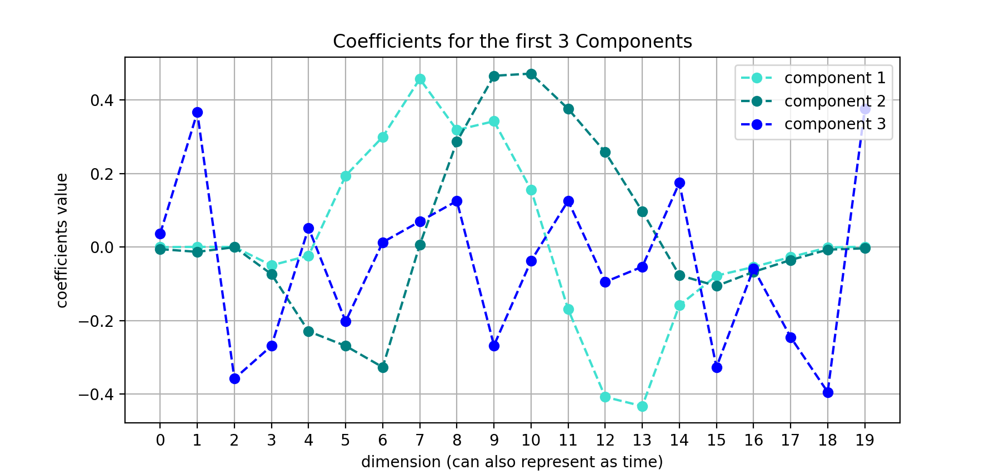

In [882]:

fig, ax = plt.subplots(figsize=(9,4))
ax.plot(np.arange(0,20),pca.components_.T[:,0], 'o--', color='turquoise', label='component 1')
ax.plot(np.arange(0,20),pca.components_.T[:,1], 'o--', color='teal', label='component 2')
ax.plot(np.arange(0,20),pca.components_.T[:,2], 'o--', color='blue', label='component 3')
ax.set_xticks(np.arange(0,20,1))
ax.set_title('Coefficients for the first 3 Components')
ax.set_xlabel('dimension (can also represent as time)')
ax.set_ylabel('coefficients value')
ax.legend()
ax.grid()

In [1235]:
# create my own PCA
def calculate_PCA(data_mat):
    # substract mean from each dim
    shiftted_data = data_mat - np.mean(data_mat,0)
    cov_mat = np.cov(shiftted_data.T)
    w,v = eig(cov_mat)
    highest_w_index = np.argsort(w)[-3:]
    eigvec = [v[:,highest_w_index[2]],v[:,highest_w_index[1]],v[:,highest_w_index[0]]]
    proj_data = np.dot(data_mat,np.array(eigvec).T)
    
    return proj_data, eigvec

In [1236]:
projection, coeff = calculate_PCA(pca_data)
np.shape(projection)

(2000, 3)

In [1237]:
def plot_coeff(coeff):

    fig, ax = plt.subplots(figsize=(9,4))
    ax.plot(np.arange(0,20),coeff[0], 'o--', color='turquoise', label='component 1')
    ax.plot(np.arange(0,20),coeff[1], 'o--', color='teal', label='component 2')
    ax.plot(np.arange(0,20),coeff[2], 'o--', color='blue', label='component 3')
    ax.set_xticks(np.arange(0,20,1))
    ax.set_title('MY PCA: Coefficients for the first 3 Components')
    ax.set_xlabel('dimension (can also represent as time)')
    ax.set_ylabel('coefficients value')
    ax.legend()
    ax.grid()

<IPython.core.display.Javascript object>


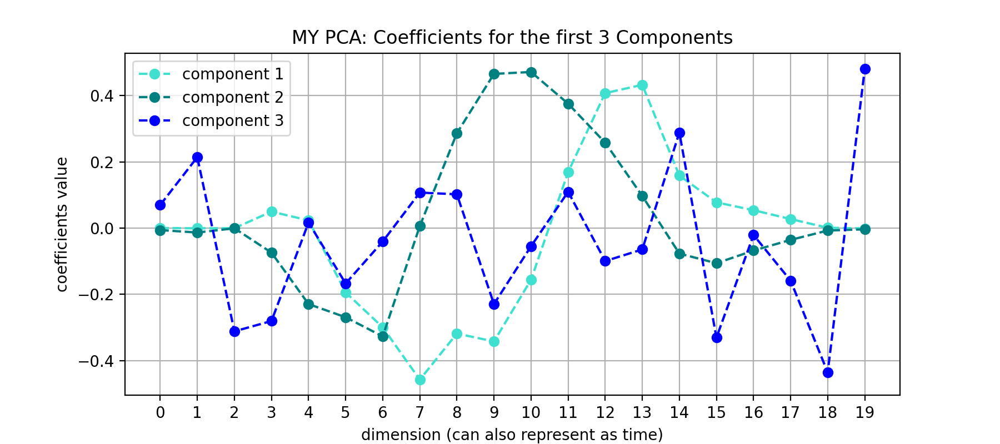

In [1238]:
plot_coeff(coeff)

<IPython.core.display.Javascript object>


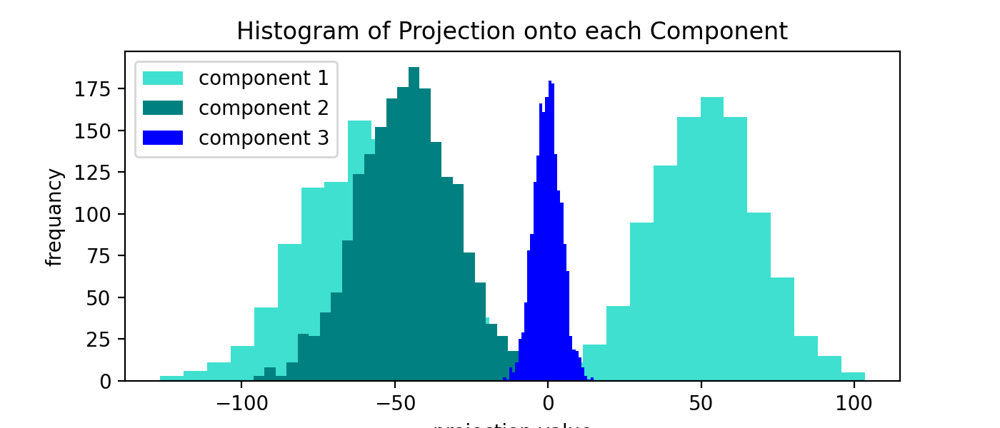

In [1239]:
# 2 - C

fig, ax = plt.subplots(figsize=(7,3))
ax.hist(projection[:,0],30, color='turquoise', label='component 1')
ax.hist(projection[:,1],30, color='teal', label='component 2')
ax.hist(projection[:,2],30, color='blue', label='component 3')
ax.set_title('Histogram of Projection onto each Component')
ax.set_xlabel('projection value')
ax.set_ylabel('frequancy')
ax.legend()

In [890]:
# plot scatter plot of pair
def plot_pair(data, num1, num2):
    fig, ax = plt.subplots(figsize=(5,5))
    ax.scatter(data[:,num1],data[:,num2],alpha=0.3)
    ax.set_title('projection on pain of pair components '+str(num1+1)+' '+str(num2+1))
    ax.set_xlabel('component '+str(num1+1))
    ax.set_ylabel('component '+str(num2+1))

<IPython.core.display.Javascript object>


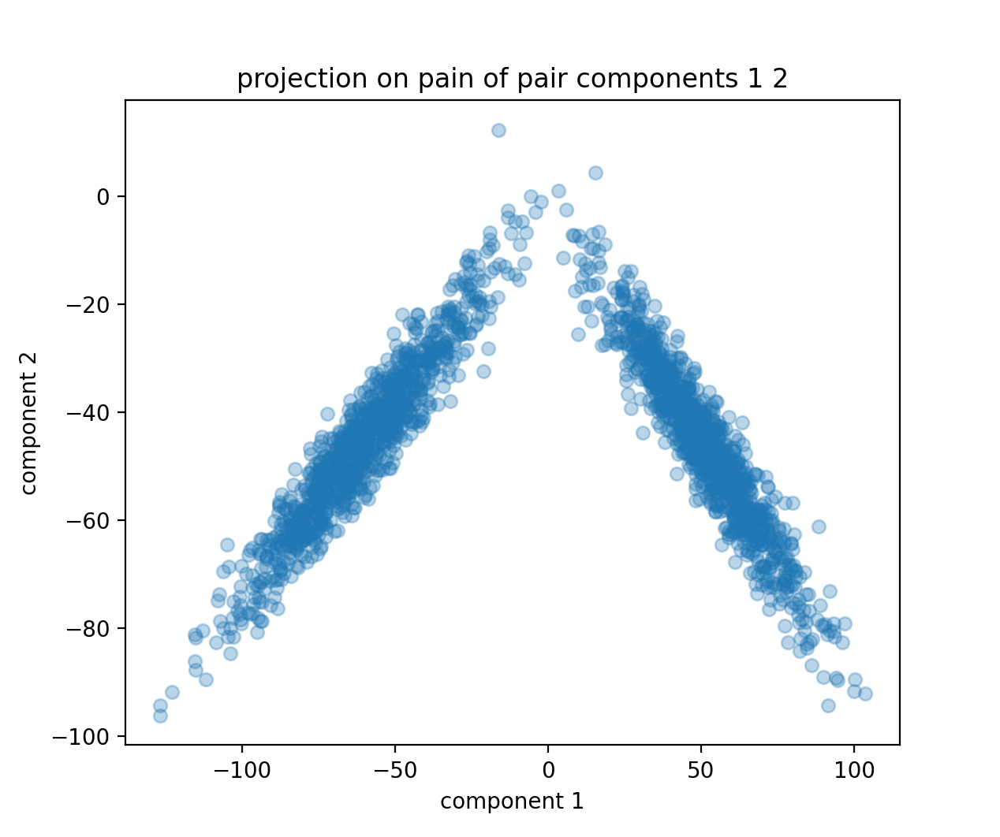

<IPython.core.display.Javascript object>


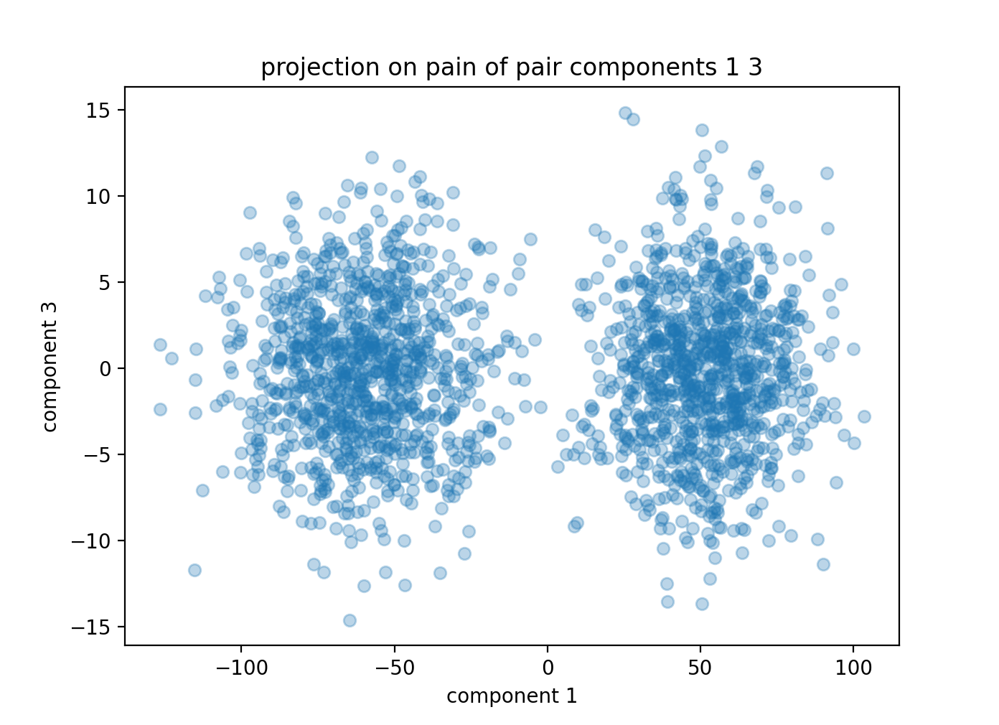

<IPython.core.display.Javascript object>


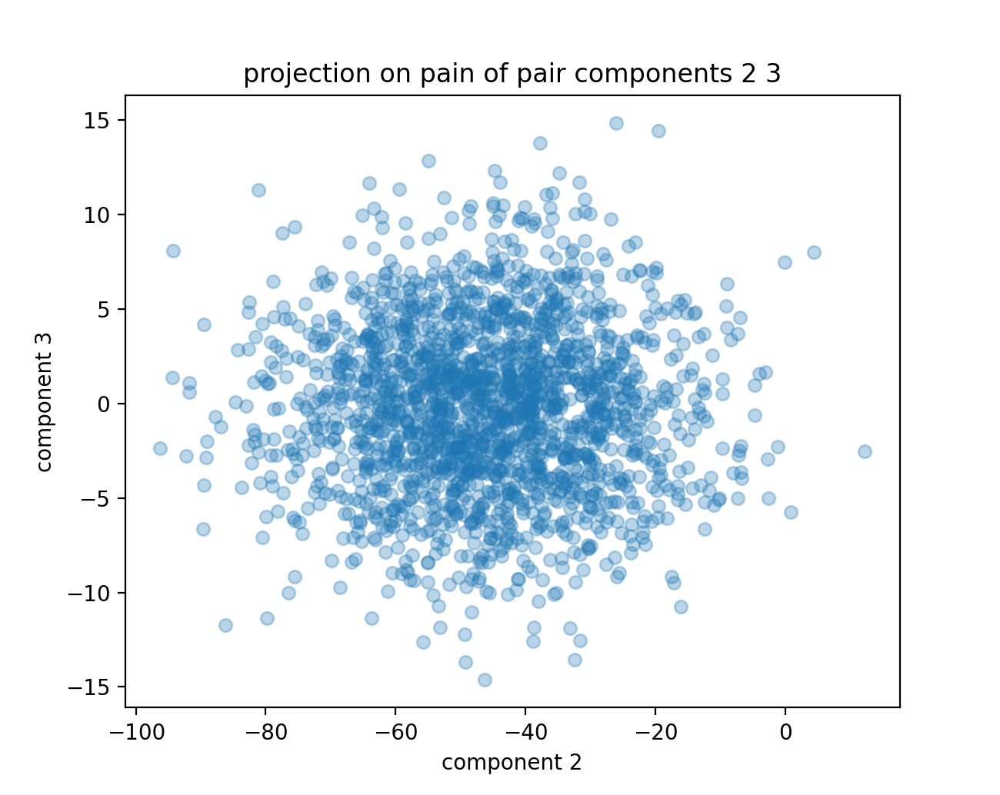

In [891]:
plot_pair(projection,0,1)
plot_pair(projection,0,2)
plot_pair(projection,1,2)

In [892]:
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn import preprocessing

# built the scatter plot data points
components_1_2 = projection[:,0:2]
components_1_3 = np.column_stack((projection[:,0],projection[:,2]))
components_2_3 = projection[:,1:3]


In [893]:
def Kmeans_output(data, num_cluster):
    kmeans = KMeans(n_clusters = num_cluster)
    labels = kmeans.fit_predict(data)
    filtered_labels = []
    for i in range(num_cluster):
        filtered_label = []
        filtered_label = data[labels == i]
        filtered_labels.append([filtered_label])
    return filtered_labels

In [894]:
def EM_output(data, num_cluster):
    gmm = GaussianMixture(n_components=num_cluster).fit(data)
    labels = gmm.predict(data)
    return labels

<IPython.core.display.Javascript object>


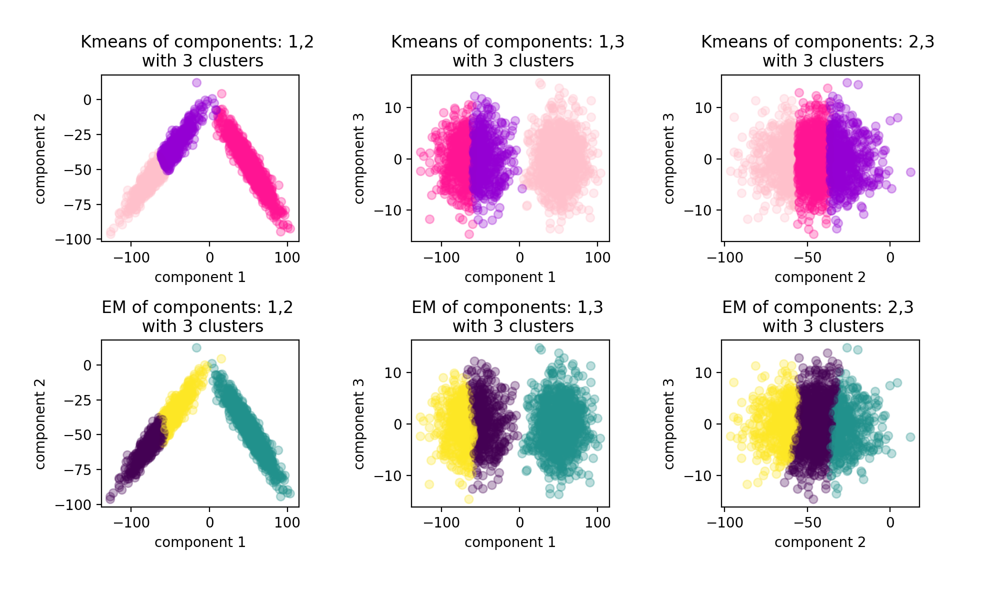

Text(634.6560457516341, 0.5, 'component 3')

In [907]:
K_out1 = Kmeans_output(components_1_2,3)
K_out2 = Kmeans_output(components_1_3,3)
K_out3 = Kmeans_output(components_2_3,3)
M_out1 = EM_output(components_1_2,3)
M_out2 = EM_output(components_1_3,3)
M_out3 = EM_output(components_2_3,3)



fig, ax = plt.subplots(2,3, figsize=(10,6))
fig.tight_layout(pad=5)
ax[0,0].scatter(K_out1[0][0][:,0],K_out1[0][0][:,1], c='pink', alpha=0.3) 
ax[0,0].scatter(K_out1[1][0][:,0],K_out1[1][0][:,1], c='deeppink', alpha=0.3) 
ax[0,0].scatter(K_out1[2][0][:,0],K_out1[2][0][:,1], c='darkviolet', alpha=0.3)
ax[0,0].set_title('Kmeans of components: 1,2 \n with 3 clusters')
ax[0,0].set_xlabel('component 1')
ax[0,0].set_ylabel('component 2')

ax[0,1].scatter(K_out2[0][0][:,0],K_out2[0][0][:,1], c='pink', alpha=0.3) 
ax[0,1].scatter(K_out2[1][0][:,0],K_out2[1][0][:,1], c='deeppink', alpha=0.3) 
ax[0,1].scatter(K_out2[2][0][:,0],K_out2[2][0][:,1], c='darkviolet', alpha=0.3) 
ax[0,1].set_title('Kmeans of components: 1,3 \n with 3 clusters')
ax[0,1].set_xlabel('component 1')
ax[0,1].set_ylabel('component 3')

ax[0,2].scatter(K_out3[0][0][:,0],K_out3[0][0][:,1], c='pink', alpha=0.3) 
ax[0,2].scatter(K_out3[1][0][:,0],K_out3[1][0][:,1], c='deeppink', alpha=0.3) 
ax[0,2].scatter(K_out3[2][0][:,0],K_out3[2][0][:,1], c='darkviolet', alpha=0.3) 
ax[0,2].set_title('Kmeans of components: 2,3 \n with 3 clusters')
ax[0,2].set_xlabel('component 2')
ax[0,2].set_ylabel('component 3')


ax[1,0].scatter(components_1_2[:, 0], components_1_2[:, 1], c=M_out1, alpha=0.3) 
ax[1,0].set_title('EM of components: 1,2 \n with 3 clusters')
ax[1,0].set_xlabel('component 1')
ax[1,0].set_ylabel('component 2')

ax[1,1].scatter(components_1_3[:, 0], components_1_3[:, 1], c=M_out2, alpha=0.3) 
ax[1,1].set_title('EM of components: 1,3 \n with 3 clusters')
ax[1,1].set_xlabel('component 1')
ax[1,1].set_ylabel('component 3')

ax[1,2].scatter(components_2_3[:, 0], components_2_3[:, 1], c=M_out3, alpha=0.3) 
ax[1,2].set_title('EM of components: 2,3 \n with 3 clusters')
ax[1,2].set_xlabel('component 2')
ax[1,2].set_ylabel('component 3')

<IPython.core.display.Javascript object>


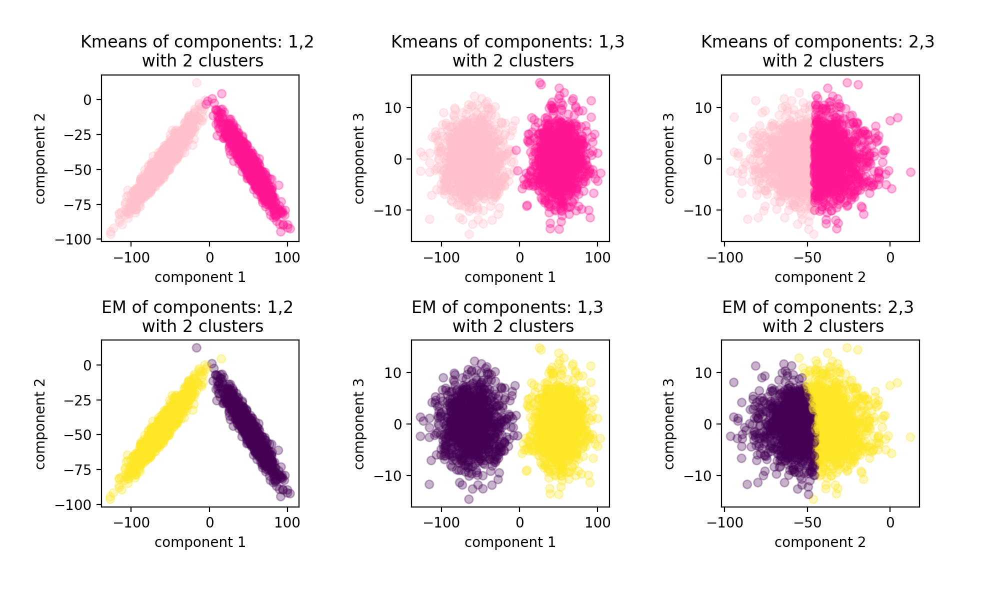

Text(634.6560457516341, 0.5, 'component 3')

In [896]:
K_out1 = Kmeans_output(components_1_2,2)
K_out2 = Kmeans_output(components_1_3,2)
K_out3 = Kmeans_output(components_2_3,2)
M_out1 = EM_output(components_1_2,2)
M_out2 = EM_output(components_1_3,2)
M_out3 = EM_output(components_2_3,2)



fig, ax = plt.subplots(2,3, figsize=(10,6))
fig.tight_layout(pad=5)
ax[0,0].scatter(K_out1[0][0][:,0],K_out1[0][0][:,1], c='pink', alpha=0.3) 
ax[0,0].scatter(K_out1[1][0][:,0],K_out1[1][0][:,1], c='deeppink', alpha=0.3) 
# ax[0,0].scatter(K_out1[2][0][:,0],K_out1[2][0][:,1], c='darkviolet')
ax[0,0].set_title('Kmeans of components: 1,2 \n with 2 clusters')
ax[0,0].set_xlabel('component 1')
ax[0,0].set_ylabel('component 2')

ax[0,1].scatter(K_out2[0][0][:,0],K_out2[0][0][:,1], c='pink', alpha=0.3) 
ax[0,1].scatter(K_out2[1][0][:,0],K_out2[1][0][:,1], c='deeppink', alpha=0.3) 
# ax[0,1].scatter(K_out2[2][0][:,0],K_out2[2][0][:,1], c='darkviolet') 
ax[0,1].set_title('Kmeans of components: 1,3 \n with 2 clusters')
ax[0,1].set_xlabel('component 1')
ax[0,1].set_ylabel('component 3')

ax[0,2].scatter(K_out3[0][0][:,0],K_out3[0][0][:,1], c='pink', alpha=0.3) 
ax[0,2].scatter(K_out3[1][0][:,0],K_out3[1][0][:,1], c='deeppink', alpha=0.3) 
# ax[0,2].scatter(K_out3[2][0][:,0],K_out3[2][0][:,1], c='darkviolet') 
ax[0,2].set_title('Kmeans of components: 2,3 \n with 2 clusters')
ax[0,2].set_xlabel('component 2')
ax[0,2].set_ylabel('component 3')


ax[1,0].scatter(components_1_2[:, 0], components_1_2[:, 1], c=M_out1, alpha=0.3) 
# ax[1,0].scatter(M_out1[1][0][:,0],M_out1[1][0][:,1]) 
# ax[1,0].scatter(M_out1[2][0][:,0],M_out1[2][0][:,1])
ax[1,0].set_title('EM of components: 1,2 \n with 2 clusters')
ax[1,0].set_xlabel('component 1')
ax[1,0].set_ylabel('component 2')

ax[1,1].scatter(components_1_3[:, 0], components_1_3[:, 1], c=M_out2, alpha=0.3) 
# ax[1,1].scatter(M_out2[1][0][:,0],M_out2[1][0][:,1]) 
# ax[1,1].scatter(M_out2[2][0][:,0],M_out2[2][0][:,1]) 
ax[1,1].set_title('EM of components: 1,3 \n with 2 clusters')
ax[1,1].set_xlabel('component 1')
ax[1,1].set_ylabel('component 3')

ax[1,2].scatter(components_2_3[:, 0], components_2_3[:, 1], c=M_out3, alpha=0.3) 
# ax[1,2].scatter(M_out3[1][0][:,0],M_out3[1][0][:,1]) 
# ax[1,2].scatter(M_out3[2][0][:,0],M_out3[2][0][:,1]) 
ax[1,2].set_title('EM of components: 2,3 \n with 2 clusters')
ax[1,2].set_xlabel('component 2')
ax[1,2].set_ylabel('component 3')

<IPython.core.display.Javascript object>


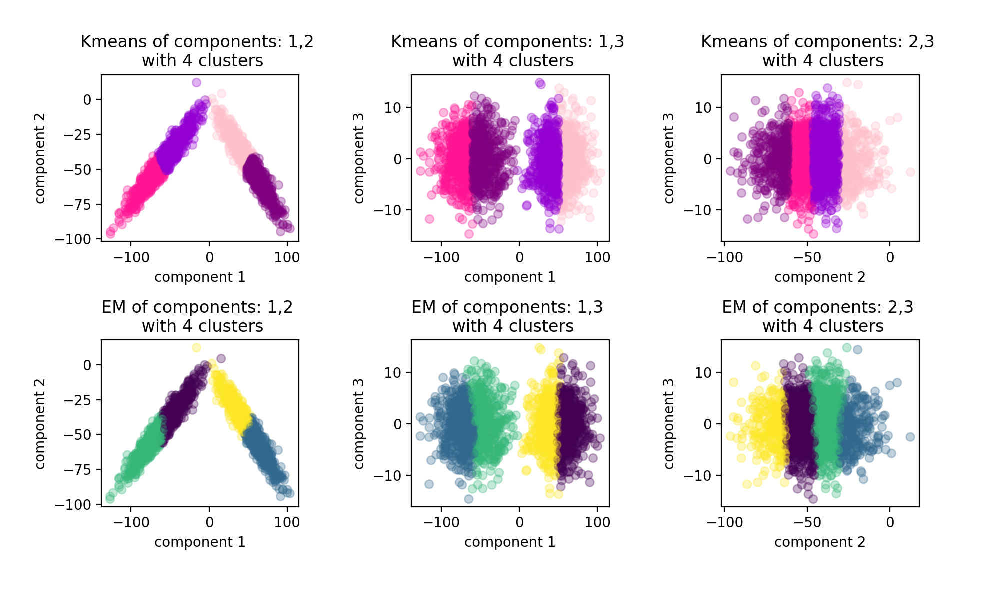

Text(634.6560457516341, 0.5, 'component 3')

In [902]:
K_out1 = Kmeans_output(components_1_2,4)
K_out2 = Kmeans_output(components_1_3,4)
K_out3 = Kmeans_output(components_2_3,4)
M_out1 = EM_output(components_1_2,4)
M_out2 = EM_output(components_1_3,4)
M_out3 = EM_output(components_2_3,4)



fig, ax = plt.subplots(2,3, figsize=(10,6))
fig.tight_layout(pad=5)
ax[0,0].scatter(K_out1[0][0][:,0],K_out1[0][0][:,1], c='pink', alpha=0.3) 
ax[0,0].scatter(K_out1[1][0][:,0],K_out1[1][0][:,1], c='deeppink', alpha=0.3) 
ax[0,0].scatter(K_out1[2][0][:,0],K_out1[2][0][:,1], c='darkviolet', alpha=0.3)
ax[0,0].scatter(K_out1[3][0][:,0],K_out1[3][0][:,1], c='purple', alpha=0.3)
ax[0,0].set_title('Kmeans of components: 1,2 \n with 4 clusters')
ax[0,0].set_xlabel('component 1')
ax[0,0].set_ylabel('component 2')

ax[0,1].scatter(K_out2[0][0][:,0],K_out2[0][0][:,1], c='pink', alpha=0.3) 
ax[0,1].scatter(K_out2[1][0][:,0],K_out2[1][0][:,1], c='deeppink', alpha=0.3) 
ax[0,1].scatter(K_out2[2][0][:,0],K_out2[2][0][:,1], c='darkviolet', alpha=0.3) 
ax[0,1].scatter(K_out2[3][0][:,0],K_out2[3][0][:,1], c='purple', alpha=0.3)
ax[0,1].set_title('Kmeans of components: 1,3 \n with 4 clusters')
ax[0,1].set_xlabel('component 1')
ax[0,1].set_ylabel('component 3')

ax[0,2].scatter(K_out3[0][0][:,0],K_out3[0][0][:,1], c='pink', alpha=0.3) 
ax[0,2].scatter(K_out3[1][0][:,0],K_out3[1][0][:,1], c='deeppink', alpha=0.3) 
ax[0,2].scatter(K_out3[2][0][:,0],K_out3[2][0][:,1], c='darkviolet', alpha=0.3) 
ax[0,2].scatter(K_out3[3][0][:,0],K_out3[3][0][:,1], c='purple', alpha=0.3)
ax[0,2].set_title('Kmeans of components: 2,3 \n with 4 clusters')
ax[0,2].set_xlabel('component 2')
ax[0,2].set_ylabel('component 3')


ax[1,0].scatter(components_1_2[:, 0], components_1_2[:, 1], c=M_out1, alpha=0.3) 
ax[1,0].set_title('EM of components: 1,2 \n with 4 clusters')
ax[1,0].set_xlabel('component 1')
ax[1,0].set_ylabel('component 2')

ax[1,1].scatter(components_1_3[:, 0], components_1_3[:, 1], c=M_out2, alpha=0.3) 
ax[1,1].set_title('EM of components: 1,3 \n with 4 clusters')
ax[1,1].set_xlabel('component 1')
ax[1,1].set_ylabel('component 3')

ax[1,2].scatter(components_2_3[:, 0], components_2_3[:, 1], c=M_out3, alpha=0.3) 
ax[1,2].set_title('EM of components: 2,3 \n with 4 clusters')
ax[1,2].set_xlabel('component 2')
ax[1,2].set_ylabel('component 3')

In [1014]:
# D - the percentage of variance each component give
pca = PCA(n_components=3)
pca.fit(pca_data)
pca.explained_variance_ratio_, pca.explained_variance_ratio_.cumsum()

(array([0.86585052, 0.06298766, 0.00463675]),
 array([0.86585052, 0.92883818, 0.93347494]))

In [1058]:
# E - dim with the highest variance
from scipy.stats import entropy
from scipy.special import entr

lvars = []
for i in range(len(pca_data[0])):
    lvars.append(np.var(pca_data[:,i]))

most_var_dim = pca_data[:,np.argmax(lvars)]


In [1059]:
most_var_dim = pca_data[:,np.argmax(lvars)]
# make all values positive
pos = np.unique(most_var_dim ** 2)
lprob_dim = pos/sum(pos)
print(len(pos))
# H = entropy(lprob_dim, base=2)
H = []
for p in lprob_dim:
    H.append(-p*np.log2(p))
sum(H)

2000


10.629372070327427

In [1060]:
pca_data = sci.io.loadmat('PCA and Clustering/dataPCA.mat')
pca_data = pca_data['lfp']
pca_data = np.array(pca_data)

pca = PCA(n_components=3)
pca.fit(pca_data)
x_pca = pca.transform(pca_data)
np.shape(x_pca), np.sum(pca.components_.T[:,0] / np.sum(pca.components_.T[:,0]))

((2000, 3), 0.9999999999999997)

In [1061]:
prob_comp1 = np.unique(pca.components_.T[:,2]**2)/ np.sum(pca.components_.T[:,2]**2)
print(len(np.unique(pca.components_.T[:,2]**2)))
H = []
for p in prob_comp1:
    H.append(-p*np.log2(p))
sum(H)


20


3.161193053487204